# Análisis  de  imágenes  Biomédicas.  Práctica  2

El objetivo es segmentar 3 capas en imágenes AS-OCT, calcular distancias entre ellas columna a columna, obtener estadísticas y visualizarlas de forma atractiva con una interfaz gráfica clara.

### Importar librerías

In [1]:
# Librerías principales
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import shapiro

# Procesamiento y visualización
from skimage.exposure import rescale_intensity
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LinearSegmentedColormap
from matplotlib.patches import Patch
from matplotlib.colorbar import ColorbarBase
from matplotlib.gridspec import GridSpec
import seaborn as sns

### Carga de Imágenes

Función para cargar y visualizar las imágenes del dataset. Se utiliza un reescalado de intensidades para homogeneizar la visualización en escala de grises.

In [ ]:
def cargar_imagenes(path, plot=True):
    """
    Función para cargar y visualizar imágenes en escala de grises desde un directorio.

    Parámetros:
    - path: ruta donde se encuentran las imágenes.
    - plot: si es True, se muestran las imágenes cargadas.

    Devuelve:
    - images: diccionario con las imágenes reescaladas (clave: nombre archivo).
    - image_names: lista con los nombres de los archivos cargados.
    """

    # Lista de nombres de archivos
    image_names = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]

    # Diccionario para ir almacenando las distintas imágenes
    images = {}

    if plot==True:
        # Cargar y mostrar las imágenes
        fig, axs = plt.subplots(2, 4, figsize=(20, 10))
        axs = axs.flatten()

    # Lectura y reescalado de intensidad
    for i, image in enumerate(image_names):
        img = cv2.imread(os.path.join(path, image), cv2.IMREAD_GRAYSCALE)
        image_rescaled = rescale_intensity(img, in_range='image', out_range=(0,255)).astype(np.uint8)
        images[image] = {'original': image_rescaled} # imagen original reescalada
        if plot==True:
            axs[i].imshow(image_rescaled, cmap='gray')
            axs[i].set_title(image)
            axs[i].axis('off')
    
    if plot==True:
        plt.tight_layout()
        plt.show()
    
    return images, image_names

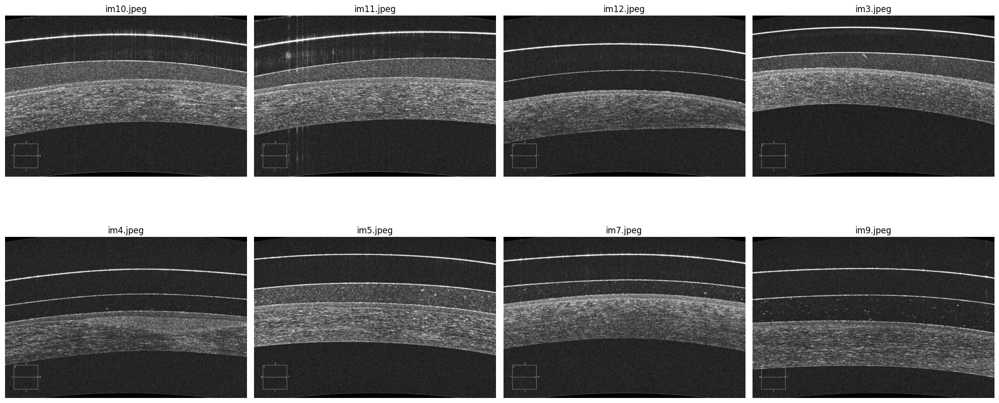

In [3]:
images, image_files = cargar_imagenes("D:/MUBICS/Imagen_Biomedica/Practicas/P2/Dataset AS-OCT/Dataset AS-OCT/AS-OCT", plot=True)

## Preprocesado de Imágenes
El objetivo es eliminar el ruido (moteado y opacidades) mediante un filtro de mediana y técnicas morfológicas. Se detectan bordes horizontales con Sobel y se aplica un filtrado por tamaño para quedarse con las estructuras relevantes.

In [4]:
def preprocesado_imagen(image, image_name="", plot=True):
    """
    Función para eliminar ruido y resaltar bordes horizontales mediante técnicas morfológicas.

    Parámetros:
    - image: imagen en escala de grises a procesar.
    - image_name: nombre de la imagen (para título si se muestra).
    - plot: si es True, se visualizan las etapas del proceso.

    Devuelve:
    - close: imagen binaria con las capas resaltadas (última etapa del procesamiento).
    """
    
    # Aplicar filtro de mediana para quitar moteado
    img_filtered = cv2.medianBlur(image, 11)

    # Detectar bordes horizontales (sobel eje y)
    sobel_y = cv2.Sobel(img_filtered, cv2.CV_64F, 0, 1, ksize=3)
    sobel_y_abs = np.abs(sobel_y)
    
    # Umbralización
    sobel_y_abs = np.uint8(sobel_y_abs)
    thr, dst = cv2.threshold(sobel_y_abs, 17, 255, cv2.THRESH_BINARY)
    # dst = cv2.adaptiveThreshold(sobel_y_abs, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 21, 12)

    # Apertura (con kernel lineal horizontal para cerrar istmos entre líneas y ruido)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,1))
    opening1 = cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel, iterations = 1)

    # Perfil de intensidades
    perfil_bordes = np.mean(opening1, axis=1)

    # Segmentación
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(opening1)

    # Crear una máscara para filtrar los objetos pequeños y el borde
    filtered_mask = np.zeros_like(opening1)

    # Definir un umbral para eliminar puntos pequeños (ruido) y borde exterior
    area_threshold_min = 5000 # para eliminar puntos/manchas
    # area_threshold_max = 1000000
    
    # Eliminar borde exterior y ruido mediante filtro de área
    for i in range(1, num_labels):  # Evitamos el fondo (label 0)
        _, _, _, _, area = stats[i] # area: Cantidad de píxeles del objeto detectado
        if area > area_threshold_min:
            filtered_mask[labels == i] = 255  

    # Apertura (volver a separar posibles istmos)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,1))
    opening2 = cv2.morphologyEx(filtered_mask, cv2.MORPH_OPEN, kernel, iterations = 1)

    # Cierre para rellenar líneas de capas (devolveremos esta última)
    close = cv2.morphologyEx(opening2, cv2.MORPH_CLOSE, (3,3), iterations = 6)

    if plot==True:
        # Visualizar antes y después
        fig, ax = plt.subplots(3,3, figsize=(12,10))

        ax[0,0].imshow(image, cmap='gray')
        ax[0,0].set_title("{} | Imagen original".format(image_name))

        ax[0,1].imshow(img_filtered, cmap='gray')
        ax[0,1].set_title("Filtrado de mediana (eliminar ruido)")

        ax[0,2].imshow(sobel_y_abs, cmap='gray')
        ax[0,2].set_title("Sobel Y (bordes horizontales)")

        ax[1,0].imshow(dst, cmap='gray')
        ax[1,0].set_title("Umbral binario (resaltar bordes)")

        ax[1,1].imshow(opening1, cmap='gray')
        ax[1,1].set_title("Apertura horizontal (limpieza)")

        ax[1,2].plot(perfil_bordes)
        ax[1,2].grid(True)
        ax[1,2].set_title("Perfil vertical (recuento por fila)")

        ax[2,0].imshow(labels, cmap='nipy_spectral')
        ax[2,0].set_title("Segmentación")

        ax[2,1].imshow(filtered_mask, cmap='gray')
        ax[2,1].set_title("Filtro por área + apertura")

        ax[2,2].imshow(close, cmap='nipy_spectral')
        ax[2,2].set_title("Cierre morfológico (reconstrucción)")

        plt.show()

    return close

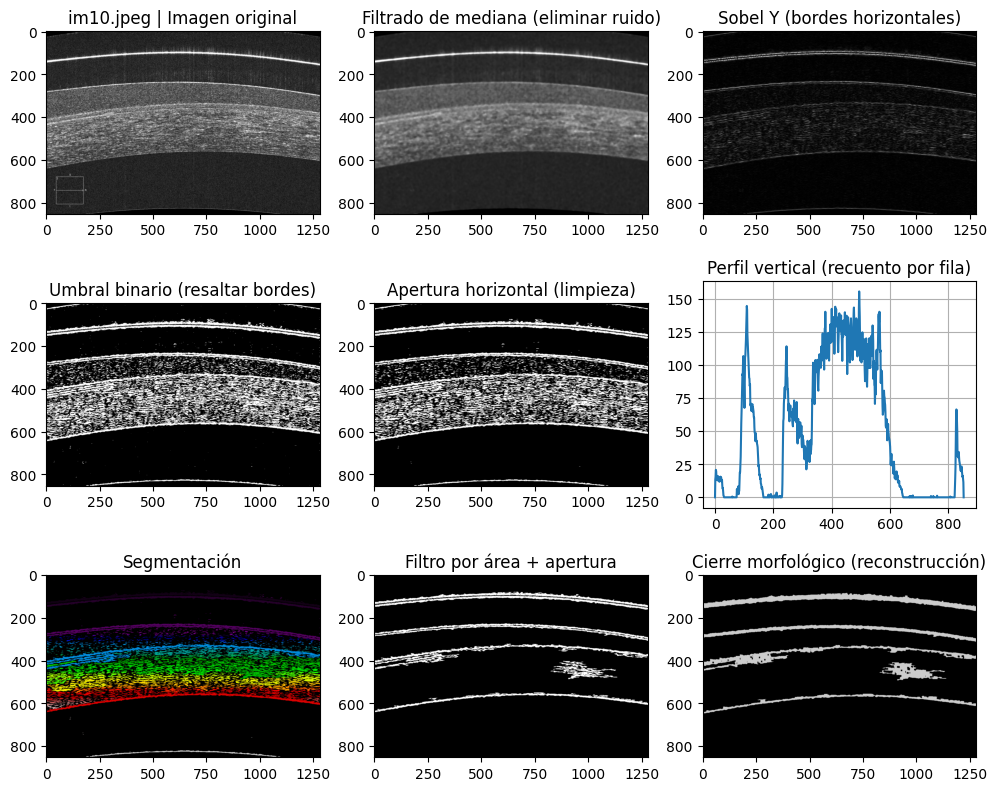

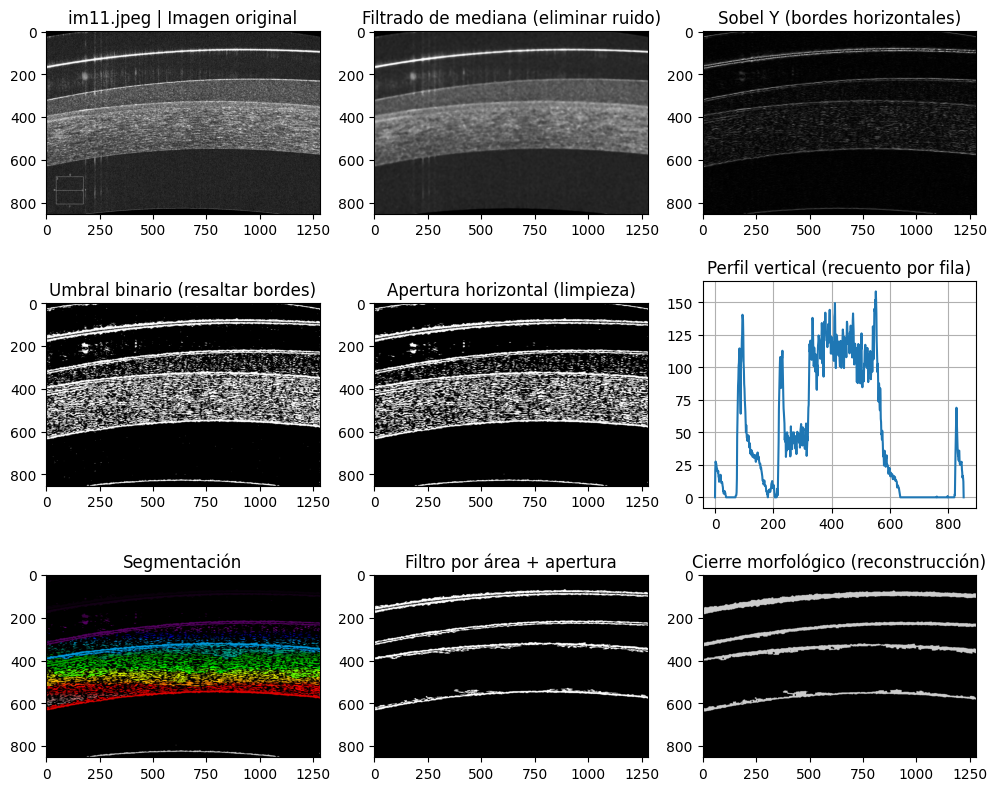

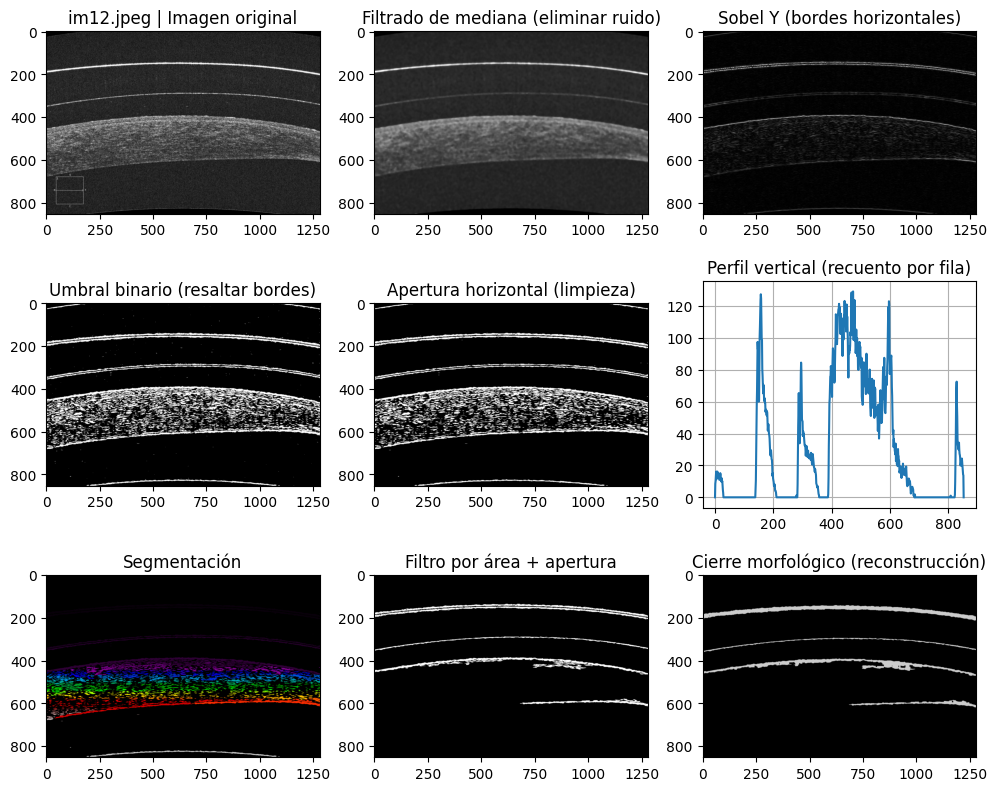

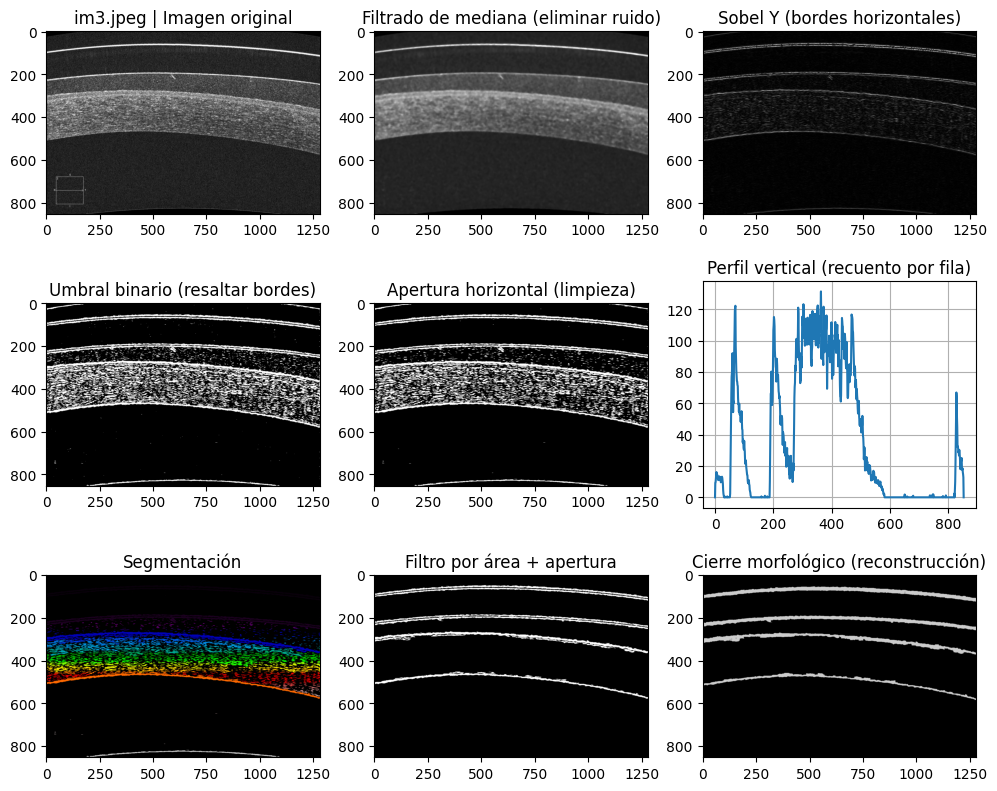

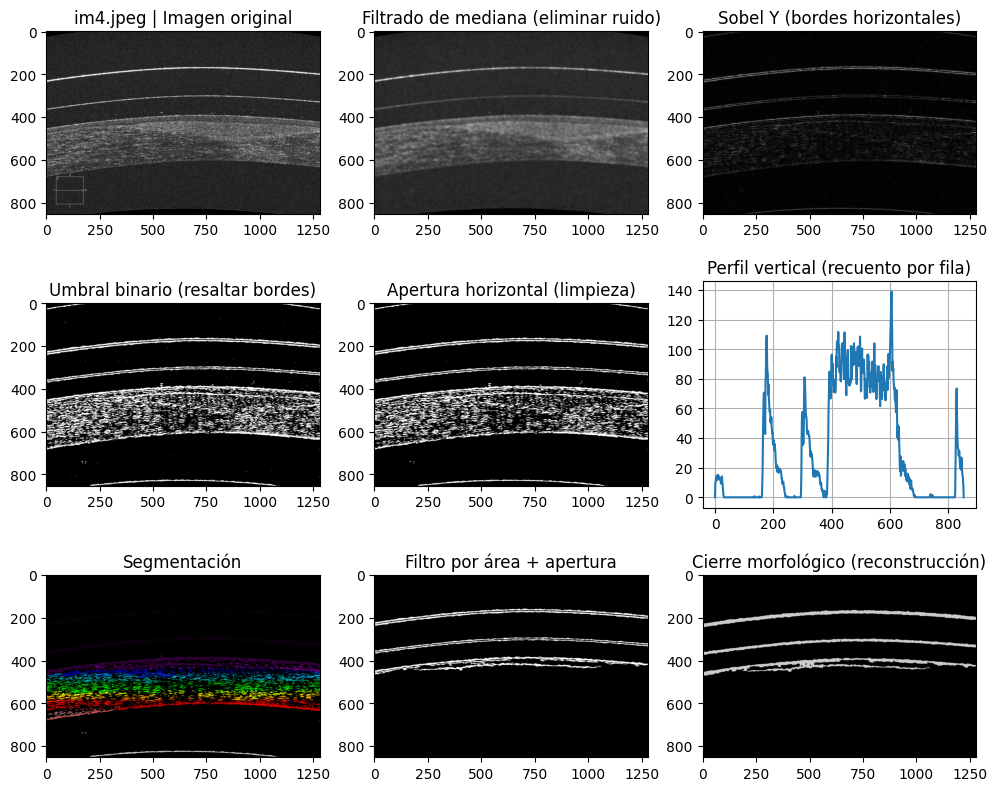

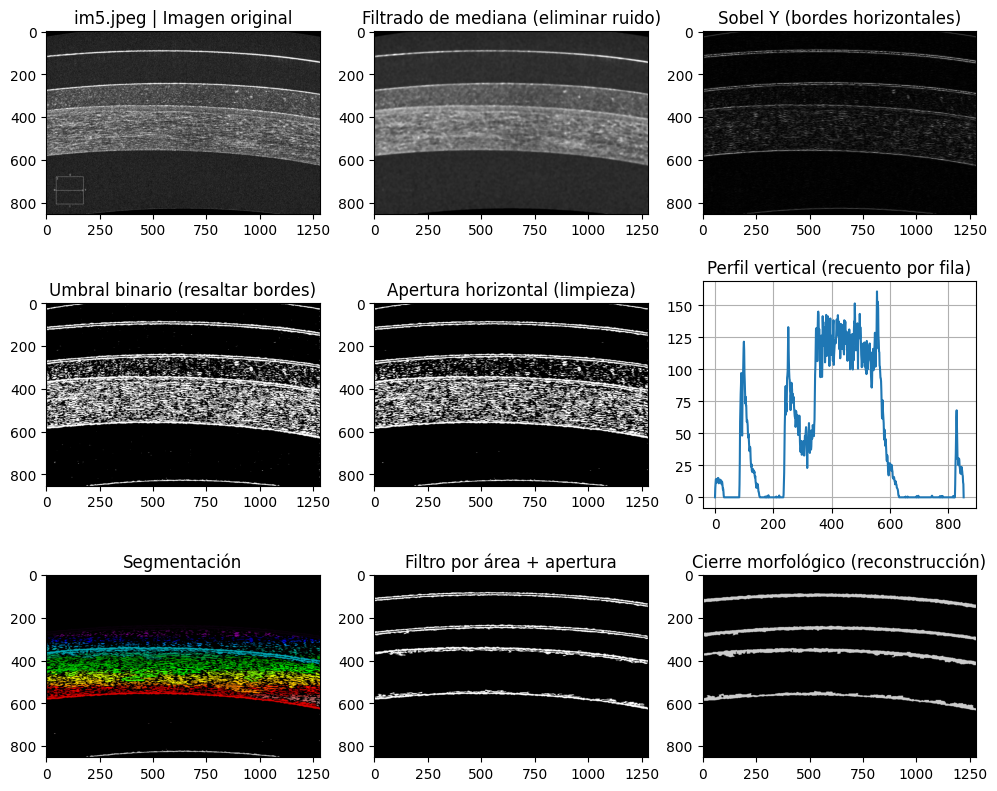

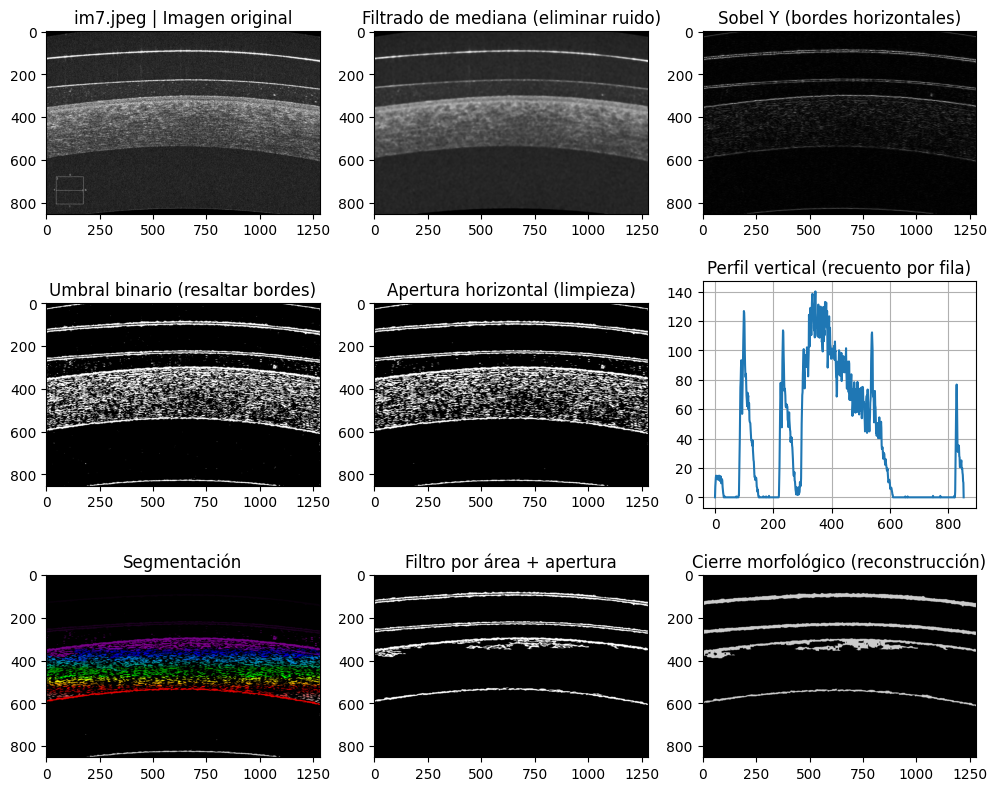

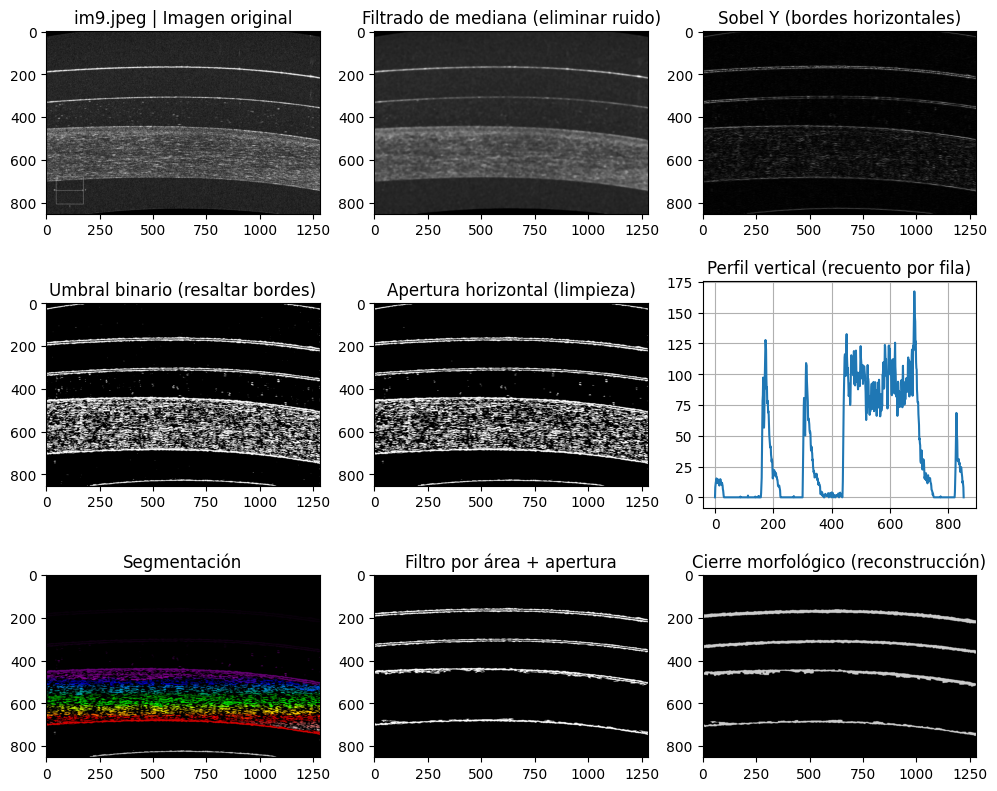

In [5]:
for image in image_files:

    images[image]['filtered'] = preprocesado_imagen(images[image]['original'], image_name=image, plot=True)

## Segmentación de Capas por Columnas
Se detectan las 3 capas de interés analizando la imagen columna por columna, identificados tras el preprocesado.

In [6]:
def detectar_picos(columna, n_picos=3, min_dist=20):
    """
    Función para detectar las posiciones de los primeros picos no nulos en una columna.

    Parámetros:
    - columna: vector de intensidades (vertical).
    - n_picos: número de picos a detectar.
    - min_dist: distancia mínima entre picos.

    Devuelve:
    - picos: lista con las posiciones de los picos detectados.
    """

    picos = []

    for i in range(len(columna)):
        # Si el valor es distinto de cero y aún no se han encontrado todos los picos
        if columna[i] != 0 and len(picos) < n_picos:
            # Si es el primer pico, añadirlo
            if len(picos) == 0: 
                picos.append(i)
            # Si hay otros picos, comprobar que esté a suficiente distancia del anterior
            elif abs(i - picos[-1]) >= min_dist:
                picos.append(i)
    # Devuelve los picos encontrados
    return picos

In [7]:
def segmentar_capas_por_columnas_manual(imagen_filtrada):
    """
    Función para recorrer cada columna de la imagen y detectar las 3 capas más relevantes.

    Parámetros:
    - imagen_filtrada: imagen binaria resultante del preprocesado.

    Devuelve:
    - y1s, y2s, y3s: arrays con las posiciones (en Y) de las 3 capas para cada columna.
    """

    altura, ancho = imagen_filtrada.shape
    y1s, y2s, y3s = [], [], []

    for col in range(ancho):
        # Obtener el perfil de intensidades de la columna
        perfil = imagen_filtrada[:, col]
        # Buscar los tres picos más relevantes
        picos = detectar_picos(perfil, n_picos=3, min_dist=40)

        # Si se detectan tres picos, se guardan
        if len(picos) == 3:
            y1s.append(picos[0])
            y2s.append(picos[1])
            y3s.append(picos[2])
        # Si no se detectan tres picos, se guarda NaN
        else:
            y1s.append(np.nan)
            y2s.append(np.nan)
            y3s.append(np.nan)

    # Devuelve los arrays con las posiciones de cada capa
    return np.array(y1s), np.array(y2s), np.array(y3s)

In [8]:
for image in image_files:

    [y1s, y2s, y3s] = segmentar_capas_por_columnas_manual(images[image]['filtered'])
    
    images[image]['picos'] = {'y1': y1s, 'y2': y2s, 'y3': y3s}

    print("-"*10)
    print(image)
    print("-"*10)
    print(images[image]['picos'])
    print()
    

----------
im10.jpeg
----------
{'y1': array([136, 136, 136, ..., 152, 152, 152]), 'y2': array([284, 284, 284, ..., 300, 300, 300]), 'y3': array([410, 410, 410, ..., 379, 379, 379])}

----------
im11.jpeg
----------
{'y1': array([159, 158, 158, ...,  92,  92,  92]), 'y2': array([319, 319, 319, ..., 232, 233, 233]), 'y3': array([395, 395, 395, ..., 351, 351, 351])}

----------
im12.jpeg
----------
{'y1': array([188, 188, 187, ..., 199, 199, 199]), 'y2': array([359, 359, 359, ..., 350, 350, 350]), 'y3': array([455, 455, 455, ..., 468, 468, 468])}

----------
im3.jpeg
----------
{'y1': array([ 96,  96,  96, ..., 113, 113, 113]), 'y2': array([227, 227, 227, ..., 245, 245, 245]), 'y3': array([299, 299, 299, ..., 366, 366, 366])}

----------
im4.jpeg
----------
{'y1': array([232, 232, 231, ..., 200, 200, 200]), 'y2': array([363, 363, 363, ..., 329, 329, 329]), 'y3': array([456, 456, 456, ..., 424, 424, 424])}

----------
im5.jpeg
----------
{'y1': array([117, 117, 117, ..., 143, 143, 143]), 

### Visualización de la Segmentación
Se dibujan las capas segmentadas sobre la imagen original con colores distintivos para cada capa. Permite validar visualmente la calidad de la segmentación.

In [9]:
def dibujar_segmentacion(imagen, y1, y2, y3, plot=True):
    """
    Función para dibujar las 3 capas detectadas sobre la imagen original.

    Parámetros:
    - imagen: imagen en escala de grises.
    - y1, y2, y3: arrays con las posiciones de cada capa.
    - plot: si es True, se muestra la imagen coloreada.

    Devuelve:
    - img_color: imagen en color con las capas superpuestas.
    """

    # Asegurarse de que la imagen sea de tipo uint8
    imagen = imagen.astype(np.uint8)
    # Convertir a imagen en color (BGR)
    img_color = cv2.cvtColor(imagen, cv2.COLOR_GRAY2BGR)

    # Pintar líneas horizontales para cada capa
    for x in range(len(y1)):
        if np.isscalar(y1[x]) and not np.isnan(y1[x]):
            img_color[range(int(y1[x])-1, int(y1[x])+1), x] = [255, 0, 0]    # Capa 1 - rojo
        if np.isscalar(y2[x]) and not np.isnan(y2[x]):
            img_color[range(int(y2[x])-1, int(y2[x])+1), x] = [0, 255, 0]    # Capa 2 - verde
        if np.isscalar(y3[x]) and not np.isnan(y3[x]):
            img_color[range(int(y3[x])-1, int(y3[x])+1), x] = [255, 0, 255]  # Capa 3 - rosa

    # Mostrar la imagen si se solicita
    if plot==True:
        plt.figure(figsize=(12, 6))
        plt.imshow(img_color)
        plt.title("Segmentación de capas")
        plt.axis('off')
        plt.show()

    return img_color



im10.jpeg


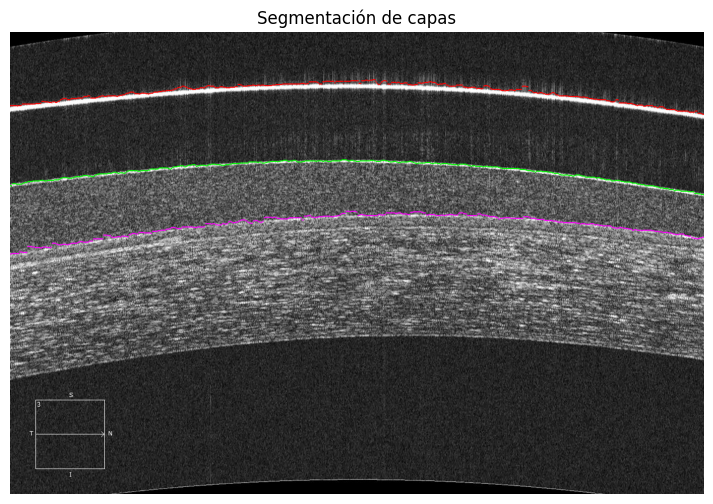

im11.jpeg


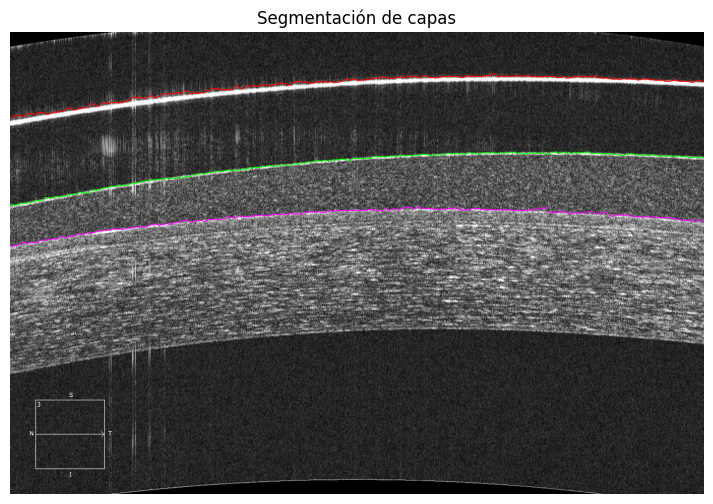

im12.jpeg


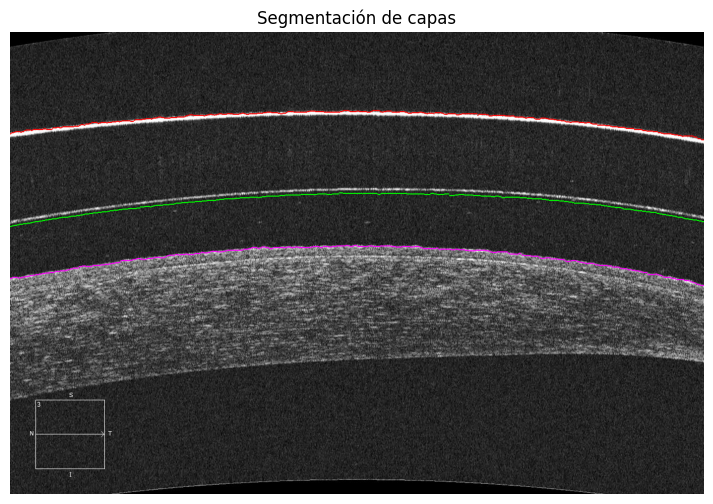

im3.jpeg


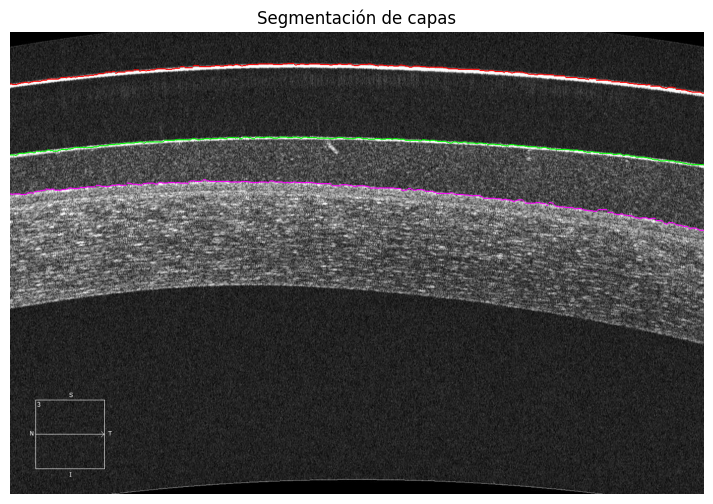

im4.jpeg


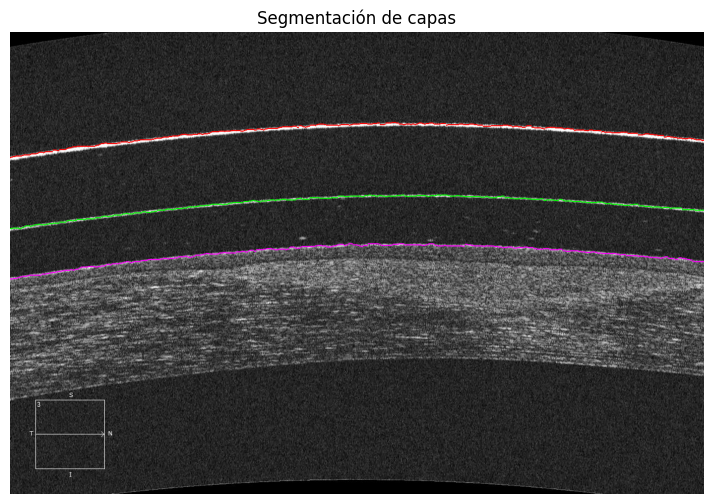

im5.jpeg


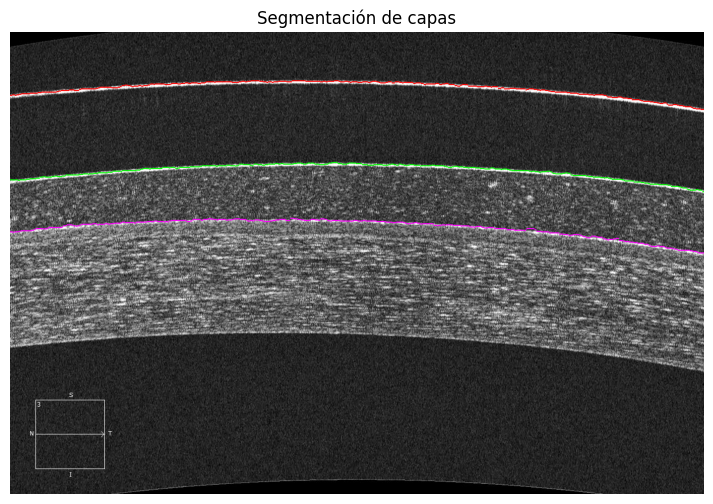

im7.jpeg


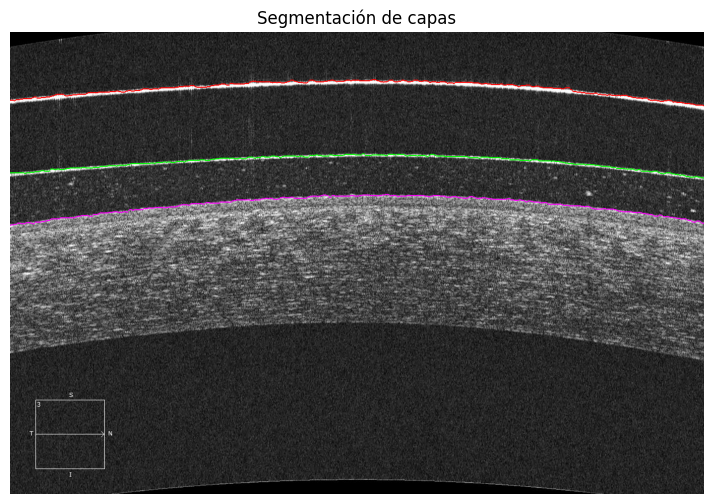

im9.jpeg


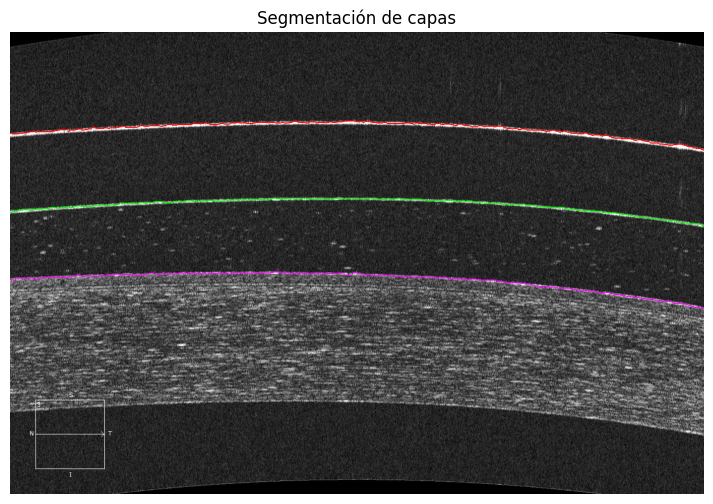

In [10]:
for image in image_files:
   print(image)
   images[image]['segmentation_plot'] = dibujar_segmentacion(images[image]['original'], images[image]['picos']['y1'], images[image]['picos']['y2'], images[image]['picos']['y3'], plot=True)


### Cálculo de Distancias entre Capas
Se calcula la distancia vertical entre las 3 capas detectadas, para cada columna de la imagen. Esto permite obtener métricas sobre la geometría corneal y su relación con la lente.

In [11]:
for image in image_files:
    distancias_12 = []
    distancias_23 = []
    distancias_13 = []

    for i in range(len(images[image]['picos']['y1'])):
        distancias_12.append(abs(images[image]['picos']['y1'][i] - images[image]['picos']['y2'][i]))
        distancias_23.append(abs(images[image]['picos']['y2'][i] - images[image]['picos']['y3'][i]))
        distancias_13.append(abs(images[image]['picos']['y1'][i] - images[image]['picos']['y3'][i]))

    images[image]["distancias"] = {"distancias_12":distancias_12, "distancias_23":distancias_23, "distancias_13":distancias_13}

In [12]:
for image in image_files:
    print("-"*10)
    print(image)
    print("-"*10)
    print("Distancias capas 1-2: ", images[image]["distancias"]["distancias_12"])
    print("Distancias capas 2-3: ", images[image]["distancias"]["distancias_23"])
    print("Distancias capas 1-3: ", images[image]["distancias"]["distancias_13"])
    print()

----------
im10.jpeg
----------
Distancias capas 1-2:  [np.int64(148), np.int64(148), np.int64(148), np.int64(148), np.int64(144), np.int64(144), np.int64(144), np.int64(144), np.int64(144), np.int64(144), np.int64(144), np.int64(145), np.int64(145), np.int64(144), np.int64(145), np.int64(145), np.int64(145), np.int64(145), np.int64(145), np.int64(145), np.int64(145), np.int64(146), np.int64(147), np.int64(147), np.int64(146), np.int64(146), np.int64(146), np.int64(145), np.int64(145), np.int64(145), np.int64(145), np.int64(144), np.int64(144), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(142), np.int64(142), np.int64(142), np.int64(142), np.int64(142), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(143), np.int64(142), np.int64(142), np.int64(143), np.int64(146), np.int64(146), np.int64(146), np.int64(146), np.int64(146),

### Cálculo de Estadísticas Descriptivas
A partir de las distancias entre capas, se obtienen métricas como media, desviación estándar, mediana, extremos, asimetría lateral y normalidad estadística (test de Shapiro-Wilk).

In [13]:
def calcular_estadisticas(d12, d23, d13, plot=True):
    """
    Calcula estadísticas descriptivas de las distancias entre capas.

    Parámetros:
    - d12, d23, d13: listas con distancias entre capas (1-2, 2-3 y 1-3).
    - plot: si es True, imprime por pantalla los resultados.

    Devuelve:
    - metrics: diccionario con métricas estadísticas (media, std, min, max, mediana, asimetría, p-valor).
    """
        
    dist12 = np.array(d12)
    dist23 = np.array(d23)
    dist13 = np.array(d13)

    # Cálculo de métricas
    metrics = {
        'dist12_mean': np.nanmean(dist12),                                              # Media
        'dist12_std': np.nanstd(dist12),                                                # Desviación estándar
        'dist12_min': np.nanmin(dist12),                                                # Valor mínimo
        'dist12_max': np.nanmax(dist12),                                                # Valor máximo
        'dist12_median': np.nanpercentile(dist12, 50),                                  # Mediana
        'asimetria_lateral_12': np.nanmean(dist12[:100]) - np.nanmean(dist12[-100:]),   # Skewness (Asimetría estadística)

        'dist23_mean': np.nanmean(dist23),
        'dist23_std': np.nanstd(dist23),
        'dist23_min': np.nanmin(dist23),
        'dist23_max': np.nanmax(dist23),
        'dist23_median': np.nanpercentile(dist23, 50),
        'asimetria_lateral_23': np.nanmean(dist23[:100]) - np.nanmean(dist23[-100:]),

        'dist13_mean': np.nanmean(dist13),
        'dist13_std': np.nanstd(dist13),
        'dist13_min': np.nanmin(dist13),
        'dist13_max': np.nanmax(dist13),
        'dist13_median': np.nanpercentile(dist13, 50),
        'asimetria_lateral_13': np.nanmean(dist13[:100]) - np.nanmean(dist13[-100:])
    }

    # Tests de normalidad de Shapiro-Wilk (eliminar NaNs antes)
    shapiro_12 = shapiro(dist12[~np.isnan(dist12)])
    shapiro_23 = shapiro(dist23[~np.isnan(dist23)])
    shapiro_13 = shapiro(dist13[~np.isnan(dist13)])

    # Añadir p-valores al diccionario de métricas
    metrics.update({
        'dist12_shapiro_p': shapiro_12.pvalue,
        'dist23_shapiro_p': shapiro_23.pvalue,
        'dist13_shapiro_p': shapiro_13.pvalue
    })

    # Imprimir las métricas si se desea
    if plot==True:
        # Mostrar resumen por consola
        print("-"*30)
        print(f"Estadísticas para {image}")
        print("-"*30)
        for key, value in metrics.items():
            print(f"{key}: {value:.2f}")
    
    # Devolver el diccionario con los resultados
    return metrics


In [14]:
for image in image_files:
    images[image]['estadisticas'] = calcular_estadisticas(images[image]["distancias"]["distancias_12"], images[image]["distancias"]["distancias_23"], images[image]["distancias"]["distancias_13"], plot=True)

------------------------------
Estadísticas para im10.jpeg
------------------------------
dist12_mean: 145.02
dist12_std: 2.52
dist12_min: 139.00
dist12_max: 155.00
dist12_median: 145.00
asimetria_lateral_12: -3.62
dist23_mean: 100.96
dist23_std: 13.46
dist23_min: 79.00
dist23_max: 130.00
dist23_median: 100.00
asimetria_lateral_23: 41.88
dist13_mean: 245.98
dist13_std: 12.45
dist13_min: 227.00
dist13_max: 274.00
dist13_median: 244.50
asimetria_lateral_13: 38.26
dist12_shapiro_p: 0.00
dist23_shapiro_p: 0.00
dist13_shapiro_p: 0.00
------------------------------
Estadísticas para im11.jpeg
------------------------------
dist12_mean: 147.56
dist12_std: 6.99
dist12_min: 137.00
dist12_max: 166.00
dist12_median: 146.00
asimetria_lateral_12: 20.66
dist23_mean: 95.38
dist23_std: 12.87
dist23_min: 73.00
dist23_max: 119.00
dist23_median: 95.00
asimetria_lateral_23: -40.28
dist13_mean: 242.94
dist13_std: 6.63
dist13_min: 230.00
dist13_max: 259.00
dist13_median: 242.00
asimetria_lateral_13: -19.62


## PLOTS
Se generaron una serie de gráficos que serán utilizados en última instancia para generar un informe final para cada imagen.

### Tablas Resumen de Métricas
Se construyen tablas que resumen de forma ordenada los estadísticos más relevantes, incluyendo una columna de normalidad estadística para evaluar la distribución de datos.

In [15]:
def obtener_tabla_metrica(dist12, dist23, dist13):
    """
    Genera una tabla resumen con estadísticas de las distancias entre capas.

    Parámetros:
    - dist12, dist23, dist13: listas con distancias entre capas.

    Devuelve:
    - tabla: DataFrame de pandas con métricas y resultado del test de normalidad.
    """

    # Asegurar arrays
    dist12 = np.array(dist12)
    dist23 = np.array(dist23)
    dist13 = np.array(dist13)

    # Test de normalidad (sin NaNs)
    shapiro_12 = shapiro(dist12[~np.isnan(dist12)])
    shapiro_23 = shapiro(dist23[~np.isnan(dist23)])
    shapiro_13 = shapiro(dist13[~np.isnan(dist13)])

    # Cálculo de métricas
    tabla = pd.DataFrame({
        'Media': [np.nanmean(dist12), np.nanmean(dist23), np.nanmean(dist13)],
        'Desv. Típica': [np.nanstd(dist12), np.nanstd(dist23), np.nanstd(dist13)],
        'Mínimo': [np.nanmin(dist12), np.nanmin(dist23), np.nanmin(dist13)],
        'Máximo': [np.nanmax(dist12), np.nanmax(dist23), np.nanmax(dist13)],
        'Mediana': [np.nanmedian(dist12), np.nanmedian(dist23), np.nanmedian(dist13)],
        'Asimetría lateral': [
            np.nanmean(dist12[:100]) - np.nanmean(dist12[-100:]),
            np.nanmean(dist23[:100]) - np.nanmean(dist23[-100:]),
            np.nanmean(dist13[:100]) - np.nanmean(dist13[-100:])
        ],
        'Shapiro p-valor': [shapiro_12.pvalue, shapiro_23.pvalue, shapiro_13.pvalue],
        '¿Normalidad?': [
            "Sí" if shapiro_12.pvalue > 0.05 else "No",
            "Sí" if shapiro_23.pvalue > 0.05 else "No",
            "Sí" if shapiro_13.pvalue > 0.05 else "No"
        ]
    }, index=['Capa 1-2', 'Capa 2-3', 'Capa 1-3'])

    return tabla

In [16]:
for image in image_files:
    images[image]['distancias']['tabla'] = obtener_tabla_metrica(images[image]['distancias']['distancias_12'], images[image]['distancias']['distancias_23'], images[image]['distancias']['distancias_13'])
    print(image)
    display(images[image]['distancias']['tabla'])

im10.jpeg


,Media,Desv. Típica,Mínimo,Máximo,Mediana,Asimetría lateral,Shapiro p-valor,¿Normalidad?
Capa 1-2,145.023438,2.523220,139,155,145.0,-3.62,4.064722e-16,No
Capa 2-3,100.959375,13.455885,79,130,100.0,41.88,2.817977e-21,No
Capa 1-3,245.982812,12.447064,227,274,244.5,38.26,4.937160e-21,No


im11.jpeg


,Media,Desv. Típica,Mínimo,Máximo,Mediana,Asimetría lateral,Shapiro p-valor,¿Normalidad?
Capa 1-2,147.55625,6.986256,137,166,146.0,20.66,4.832561e-24,No
Capa 2-3,95.38125,12.866501,73,119,95.0,-40.28,7.435927e-19,No
Capa 1-3,242.93750,6.629067,230,259,242.0,-19.62,9.981279e-17,No


im12.jpeg


,Media,Desv. Típica,Mínimo,Máximo,Mediana,Asimetría lateral,Shapiro p-valor,¿Normalidad?
Capa 1-2,154.842969,6.795416,147,173,152.0,18.48,1.194482e-32,No
Capa 2-3,101.149219,6.576622,92,119,98.0,-17.31,2.500499e-33,No
Capa 1-3,255.992188,6.529974,246,271,255.0,1.17,5.109720e-23,No


im3.jpeg


,Media,Desv. Típica,Mínimo,Máximo,Mediana,Asimetría lateral,Shapiro p-valor,¿Normalidad?
Capa 1-2,134.369531,1.914625,128,139,135.0,-3.93,7.481494e-20,No
Capa 2-3,90.602344,13.831706,70,121,88.0,-41.96,6.065222e-24,No
Capa 1-3,224.971875,14.598239,201,255,224.0,-45.89,1.722533e-20,No


im4.jpeg


,Media,Desv. Típica,Mínimo,Máximo,Mediana,Asimetría lateral,Shapiro p-valor,¿Normalidad?
Capa 1-2,133.046875,1.539883,128,137,133.0,1.80,9.811518e-18,No
Capa 2-3,90.892188,1.822413,87,96,91.0,-1.65,6.917387e-16,No
Capa 1-3,223.939063,1.655777,219,228,224.0,0.15,1.143244e-17,No


im5.jpeg


,Media,Desv. Típica,Mínimo,Máximo,Mediana,Asimetría lateral,Shapiro p-valor,¿Normalidad?
Capa 1-2,152.968750,2.563072,148,159,152.0,6.59,3.102169e-20,No
Capa 2-3,104.422656,6.752450,92,118,105.0,-20.10,3.126834e-19,No
Capa 1-3,257.391406,4.677147,248,268,257.0,-13.51,6.617378e-16,No


im7.jpeg


,Media,Desv. Típica,Mínimo,Máximo,Mediana,Asimetría lateral,Shapiro p-valor,¿Normalidad?
Capa 1-2,136.152344,2.060661,130,142,136.0,3.04,1.798587e-16,No
Capa 2-3,79.910156,5.580705,72,97,78.0,11.99,8.279407e-29,No
Capa 1-3,216.062500,5.661479,208,234,214.0,15.03,3.768237e-31,No


im9.jpeg


,Media,Desv. Típica,Mínimo,Máximo,Mediana,Asimetría lateral,Shapiro p-valor,¿Normalidad?
Capa 1-2,141.375000,1.515029,137,146,141.0,2.15,3.536754e-19,No
Capa 2-3,139.334375,7.642035,123,155,140.0,-24.08,2.975757e-17,No
Capa 1-3,280.709375,7.093785,266,295,281.0,-21.93,1.390317e-16,No


## Histogramas de las distancias

Espesor córnea (distancia capas 2-3)

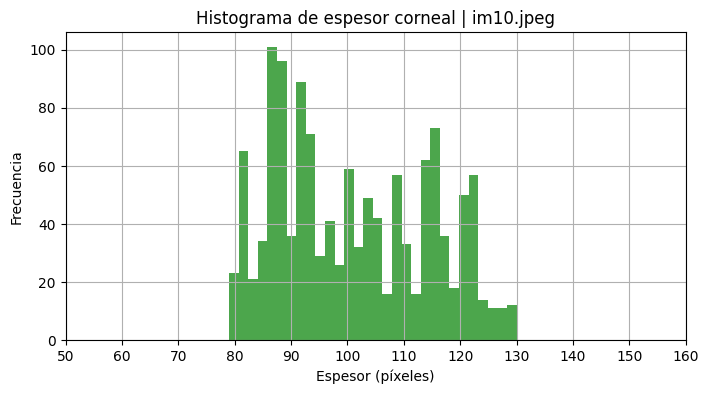

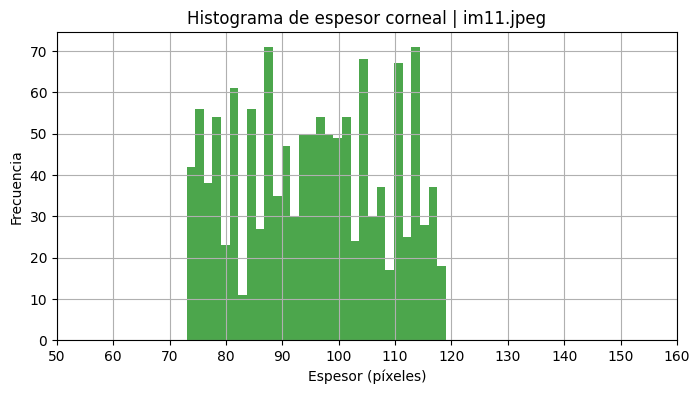

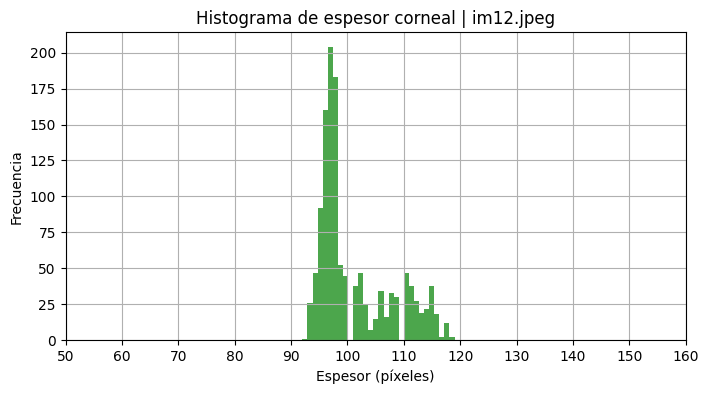

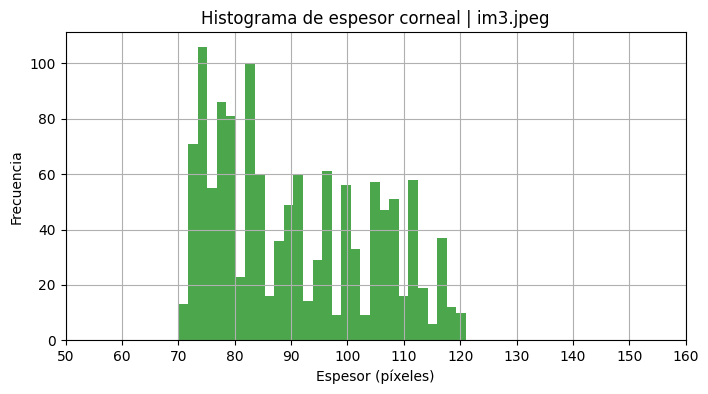

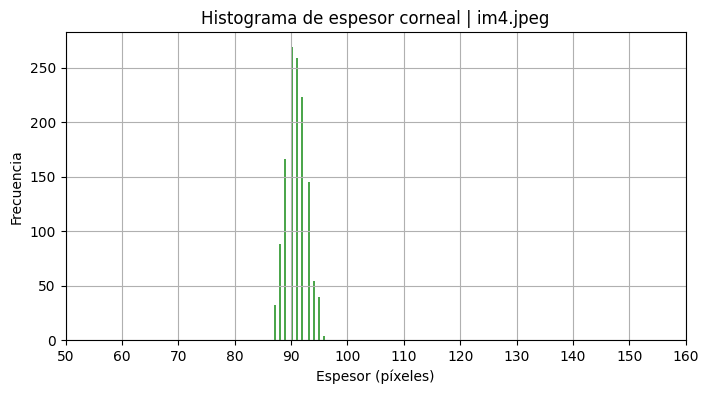

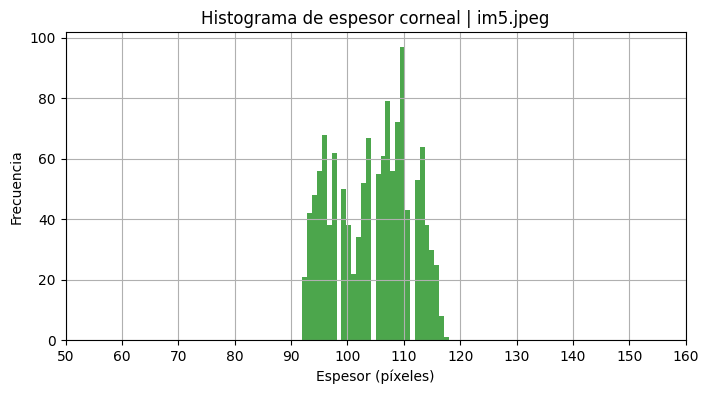

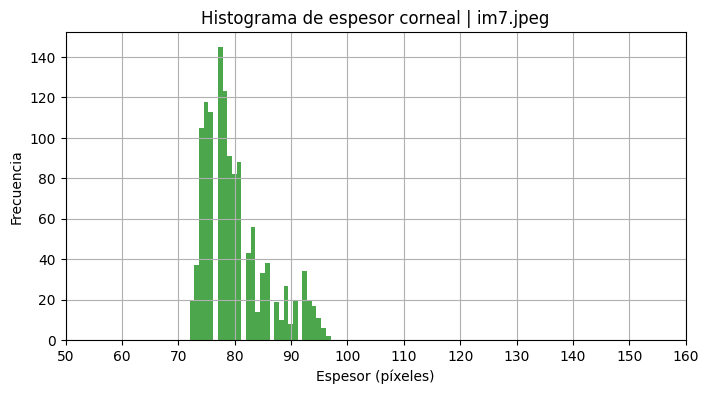

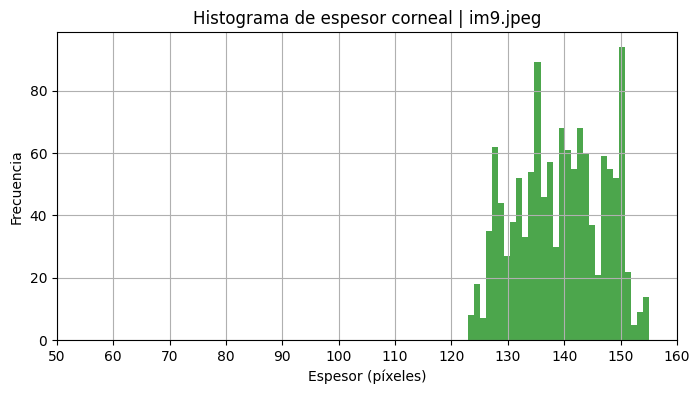

In [17]:
for image in image_files:
    dist23 = images[image]["distancias"]["distancias_23"]

    plt.figure(figsize=(8, 4))
    plt.hist(dist23, bins=30, color='green', alpha=0.7)
    plt.title(f"Histograma de espesor corneal | {image}")
    plt.xlabel("Espesor (píxeles)")
    plt.ylabel("Frecuencia")
    plt.xticks(ticks=np.arange(0, len(images[image]["distancias"]["distancias_23"]), 10))
    plt.xlim(50,160)
    plt.grid(True)
    plt.show()


Histograma de distancia lente-córnea (capas 1-2)

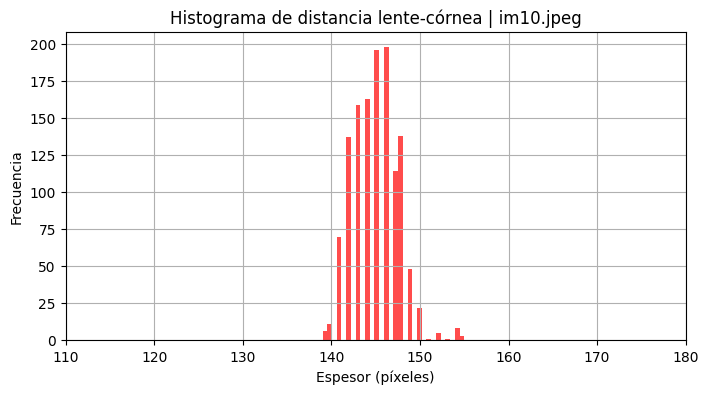

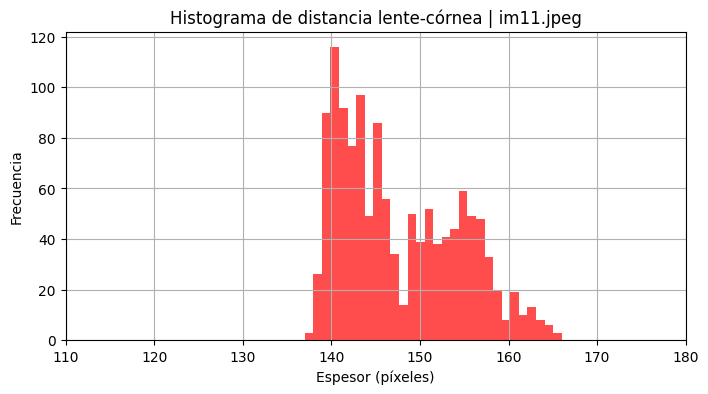

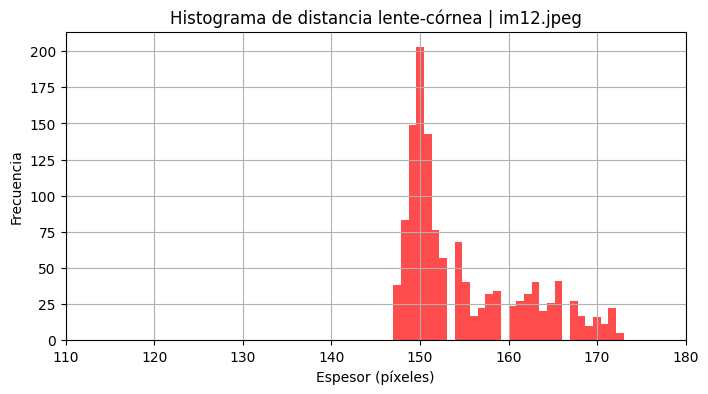

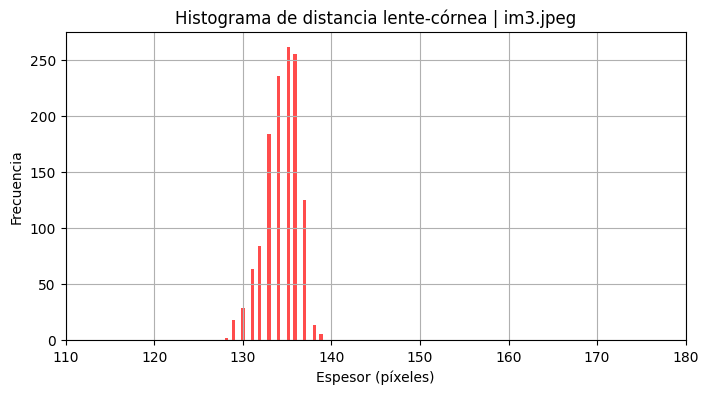

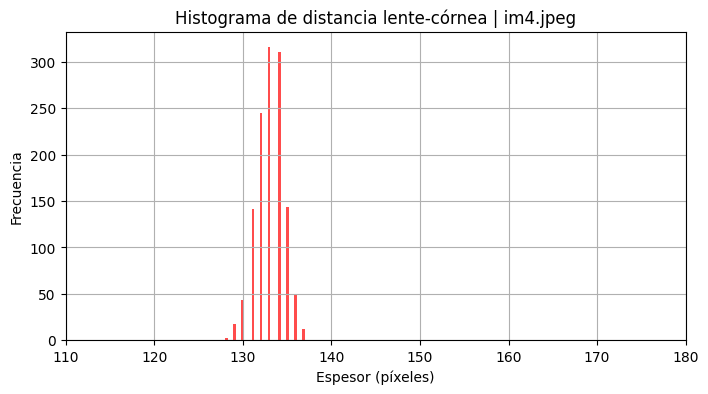

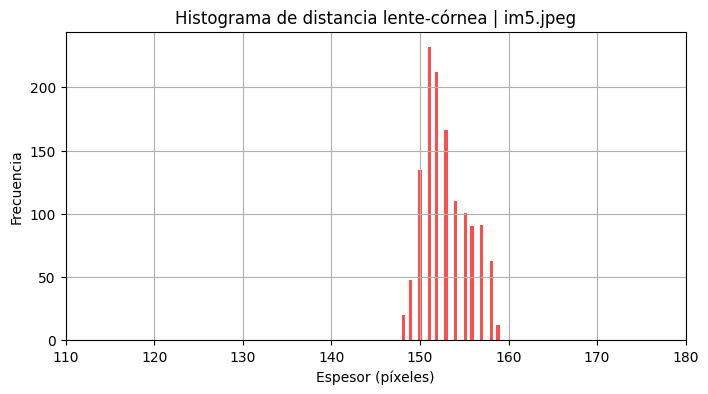

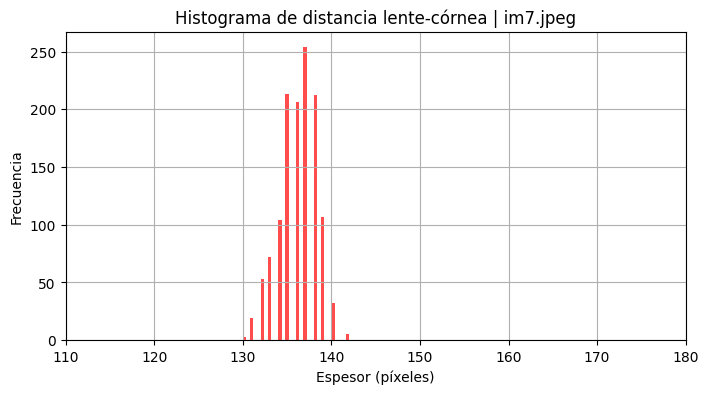

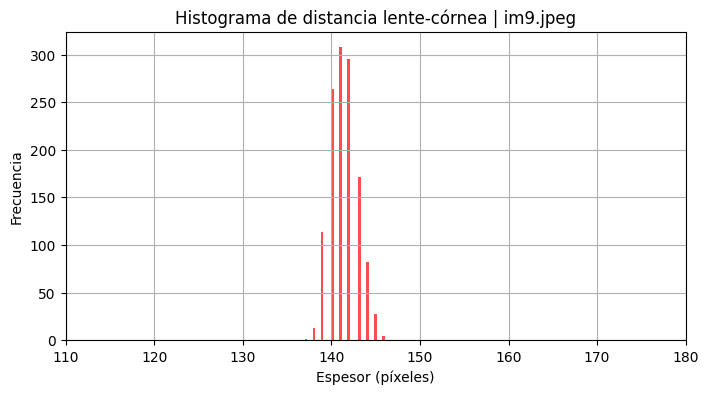

In [18]:
for image in image_files:
    dist23 = images[image]["distancias"]["distancias_12"]

    plt.figure(figsize=(8, 4))
    plt.hist(dist23, bins=30, color='red', alpha=0.7)
    plt.title(f"Histograma de distancia lente-córnea | {image}")
    plt.xlabel("Espesor (píxeles)")
    plt.ylabel("Frecuencia")
    plt.xticks(ticks=np.arange(0, len(images[image]["distancias"]["distancias_12"]), 10))
    plt.xlim(110,180)
    plt.grid(True)
    plt.show()

Distancia total (capas 1-3)

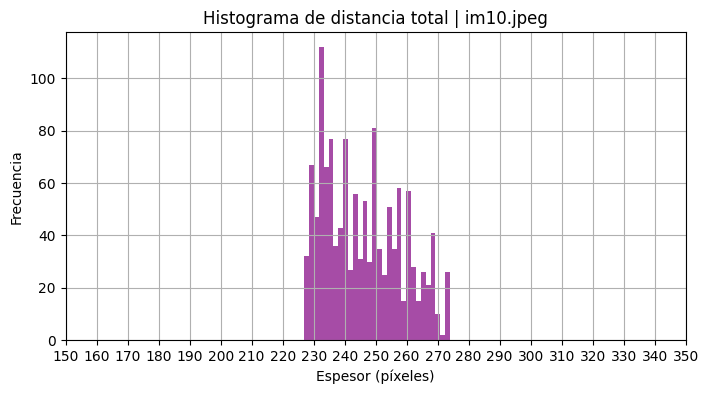

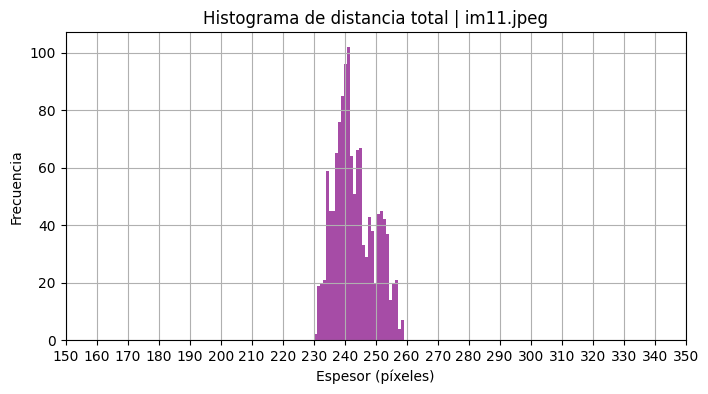

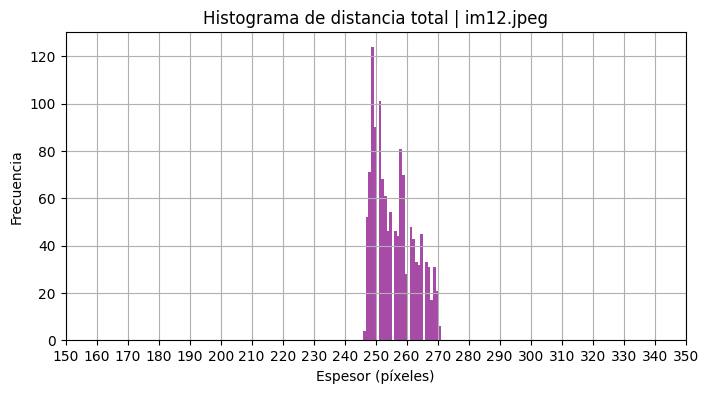

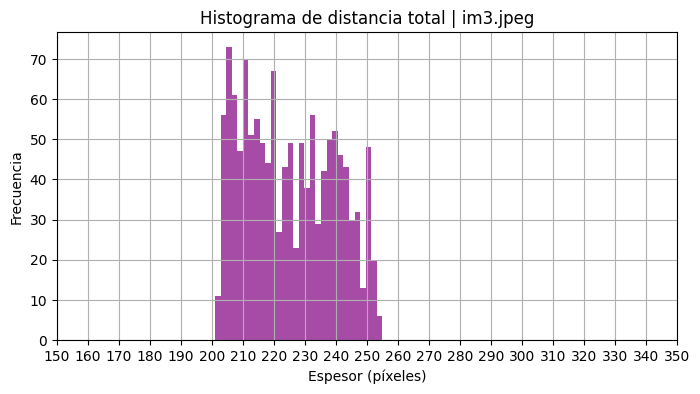

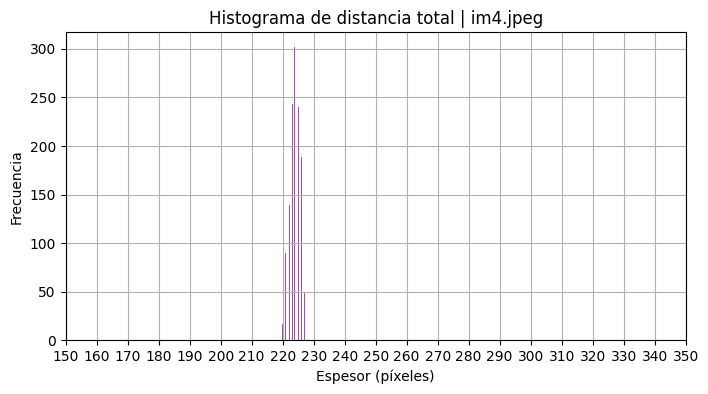

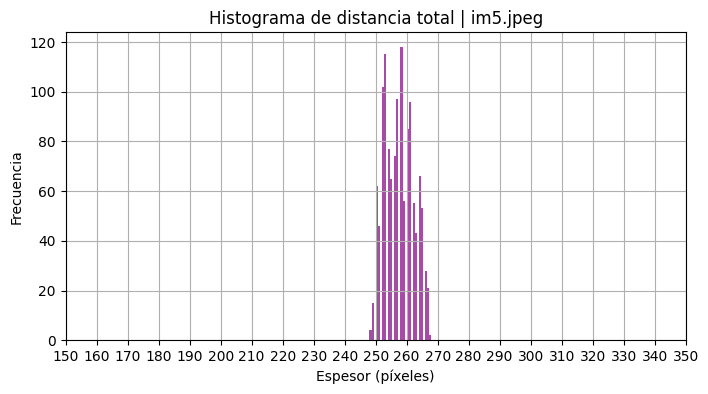

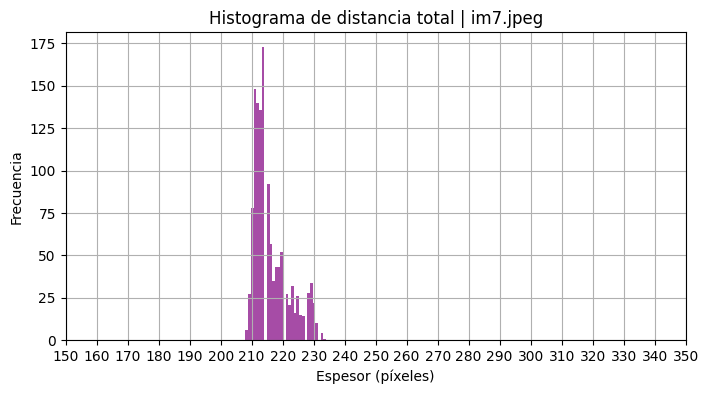

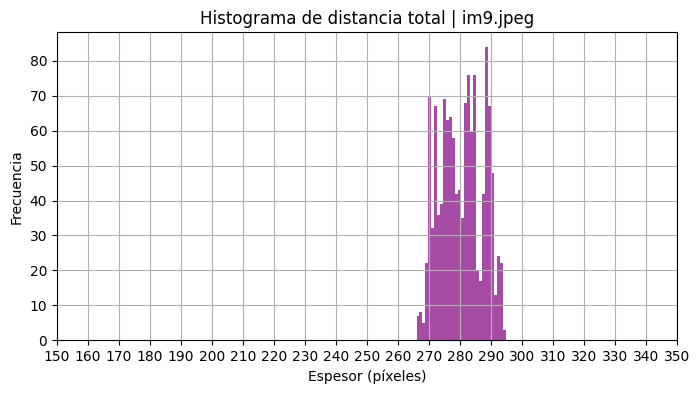

In [19]:
for image in image_files:
    dist23 = images[image]["distancias"]["distancias_13"]

    plt.figure(figsize=(8, 4))
    plt.hist(dist23, bins=30, color='purple', alpha=0.7)
    plt.title(f"Histograma de distancia total | {image}")
    plt.xlabel("Espesor (píxeles)")
    plt.ylabel("Frecuencia")
    plt.xticks(ticks=np.arange(0, len(images[image]["distancias"]["distancias_13"]), 10))
    plt.xlim(150,350)
    plt.grid(True)
    plt.show()

### Mapa de Calor de Distancias
Visualización tipo heatmap para observar las variaciones en el espesor columna a columna.

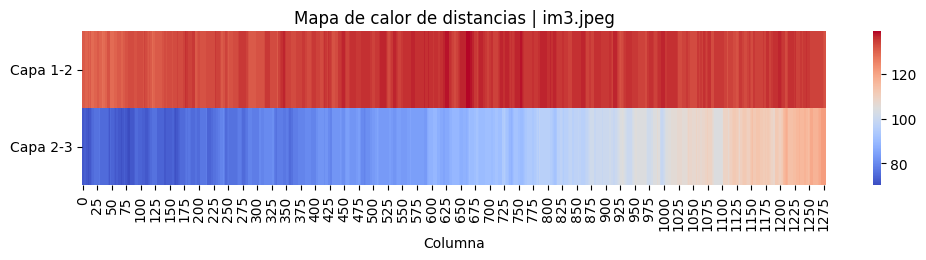

In [20]:
image = "im3.jpeg"
dist_map = np.vstack([
    images[image]["distancias"]["distancias_12"],
    images[image]["distancias"]["distancias_23"]
])

plt.figure(figsize=(12, 2))
sns.heatmap(dist_map, cmap='coolwarm', cbar=True)
plt.yticks([0.5, 1.5], ['Capa 1-2', 'Capa 2-3'], rotation=0)
plt.title(f"Mapa de calor de distancias | {image}")
plt.xlabel("Columna")
plt.show()


### Visualización Final con Interfaz Gráfica
Imagen enriquecida con líneas de segmentación, líneas verticales coloreadas según la distancia promedio y leyenda interpretativa. También incluye una barra de color para mapear las distancias.

In [21]:
def visualizar_lineas_centrales_con_leyenda(img_original, y1, y2, y3, dist12, dist23, plot=True):
    """
    Dibuja sobre la imagen original las 3 capas segmentadas y líneas verticales con colores que representan la distancia promedio.

    Parámetros:
    - img_original: imagen en color.
    - y1, y2, y3: posiciones de las capas.
    - dist12, dist23: distancias para colorear las líneas.
    - plot: si es True, muestra la imagen.

    Devuelve:
    - img_color: imagen coloreada con líneas y leyenda.
    """

    # Copia de la imagen original para no modificarla
    img_color = img_original.copy()

    # Convertir a color si es necesario
    if len(img_color.shape) == 2 or img_color.shape[2] == 1:
        img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)

    h, w, _ = img_color.shape
    centro = w // 2

    # Coordenadas centrales
    y1_m = int(y1[centro])
    y2_m = int(y2[centro])
    y3_m = int(y3[centro])

    # Dibujar las líneas horizontales de segmentación
    for x in range(w):
        if not np.isnan(y1[x]):
            img_color[int(y1[x])-1:int(y1[x])+2, x] = [255, 0, 0]      # rojo
        if not np.isnan(y2[x]):
            img_color[int(y2[x])-1:int(y2[x])+2, x] = [0, 255, 0]      # verde
        if not np.isnan(y3[x]):
            img_color[int(y3[x])-1:int(y3[x])+2, x] = [255, 0, 255]    # rosa

    # Calcular distancias medias
    d12_m = np.nanmean(dist12)
    d23_m = np.nanmean(dist23)

    # Gradiente
    vmin, vmax = 40, 180
    norm = Normalize(vmin=vmin, vmax=vmax)
    cmap = LinearSegmentedColormap.from_list("custom", ["blue", "yellow", "red"])

    color_12 = tuple(int(c * 255) for c in cmap(norm(d12_m))[:3])
    color_23 = tuple(int(c * 255) for c in cmap(norm(d23_m))[:3])

    # Dibujar líneas centrales verticales
    anchura = 3
    for dx in range(-anchura, anchura + 1):
        cv2.line(img_color, (centro + dx, y1_m), (centro + dx, y2_m), color_12, 2)
        cv2.line(img_color, (centro + dx, y2_m), (centro + dx, y3_m), color_23, 2)

    # Mostrar imagen y leyenda
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(img_color)
    ax.set_title(f"Distancias medias | Capa 1-2: {d12_m:.1f}px | Capa 2-3: {d23_m:.1f}px")
    ax.axis('off')

    # Leyenda de capas
    leyenda = [
        Patch(color='red', label='Capa 1'),
        Patch(color='green', label='Capa 2'),
        Patch(color='magenta', label='Capa 3')
    ]
    ax.legend(handles=leyenda, loc='lower right', fontsize=10)

    # Colorbar (gradiente de distancia)
    cax = fig.add_axes([0.92, 0.2, 0.015, 0.6]) #left, bottom, width, height
    cb1 = ColorbarBase(cax, cmap=cmap, norm=norm, orientation='vertical')
    cb1.set_label('Distancia (px)')

    if plot:
        plt.show()
    else:
        plt.close(fig)

    return img_color

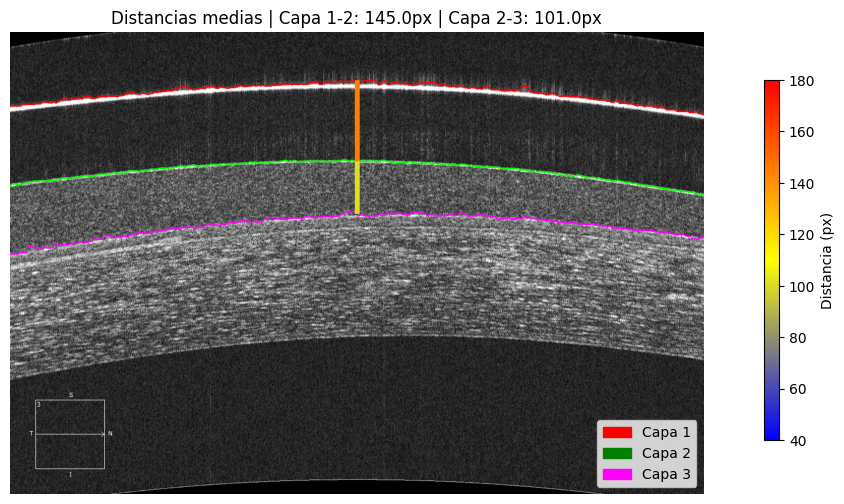

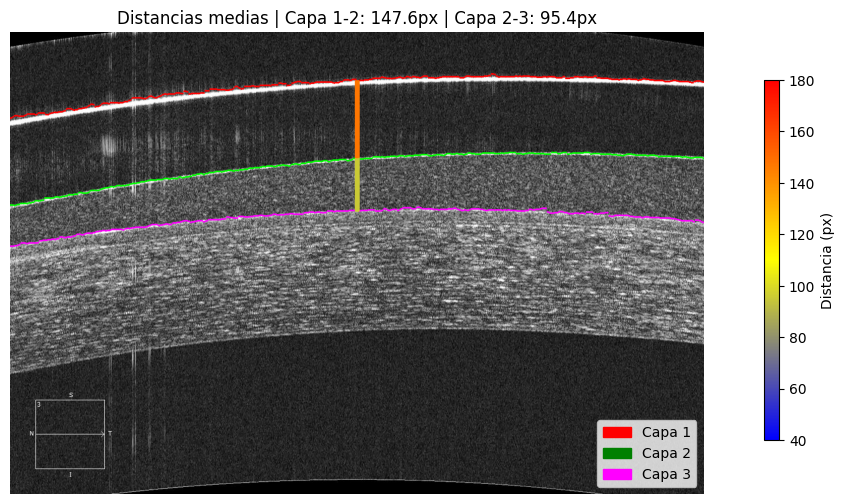

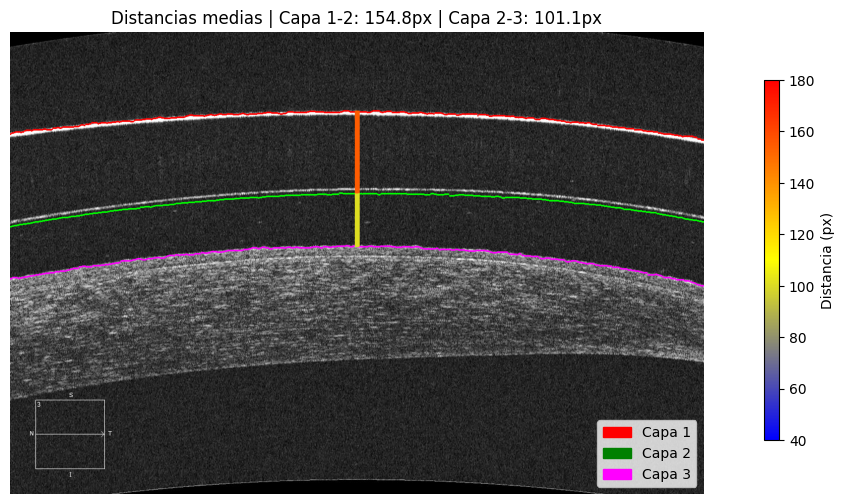

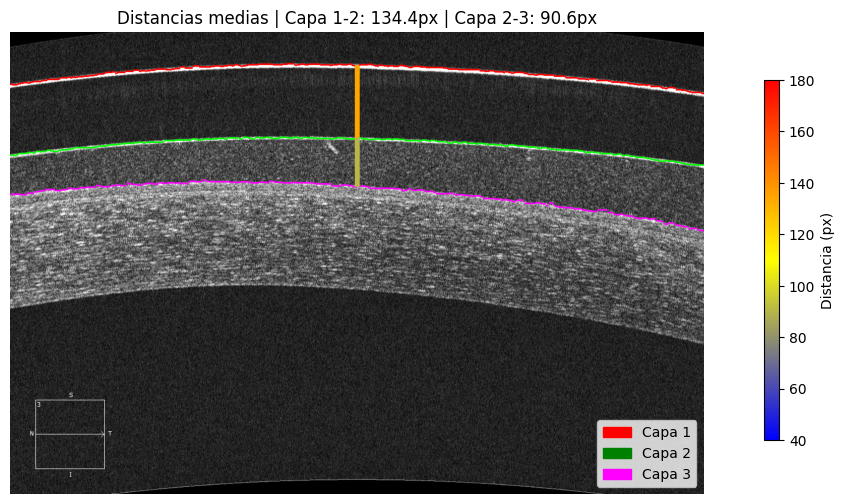

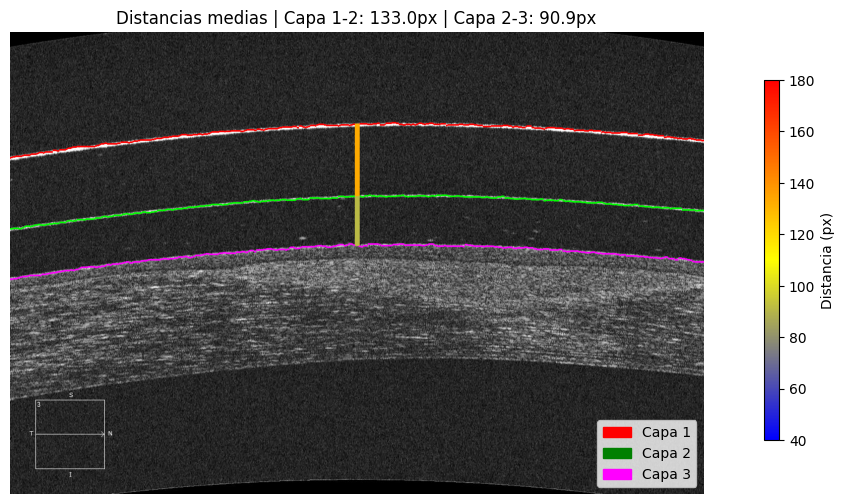

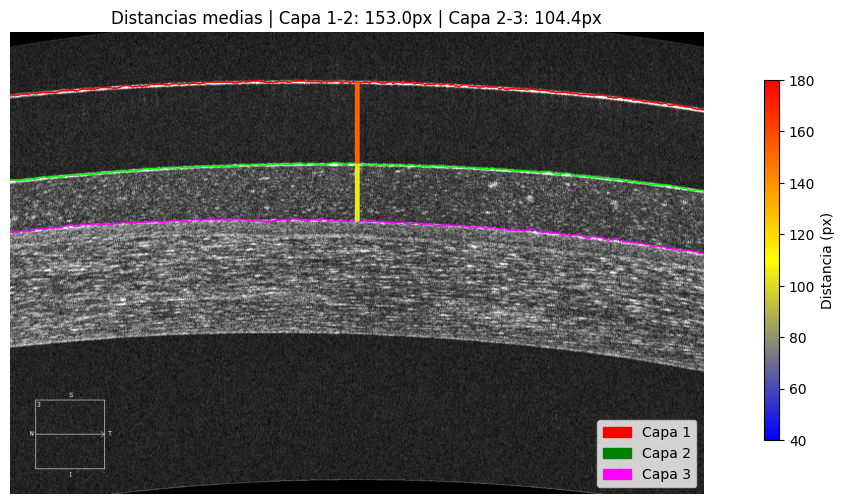

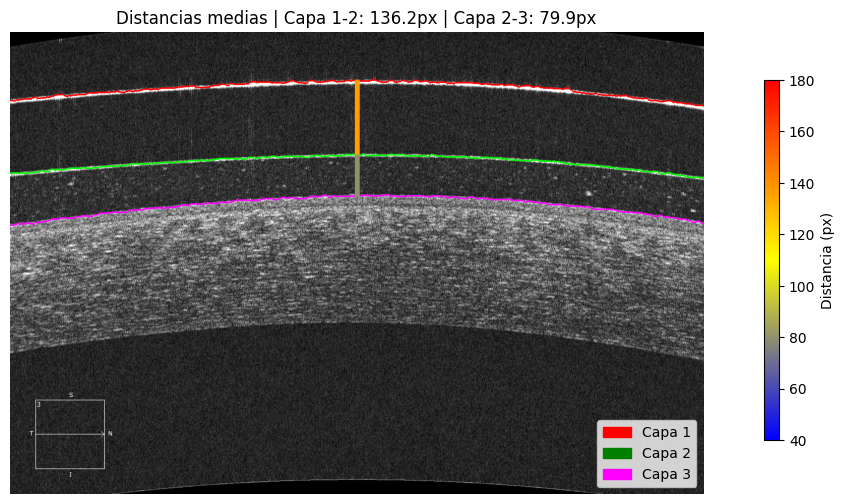

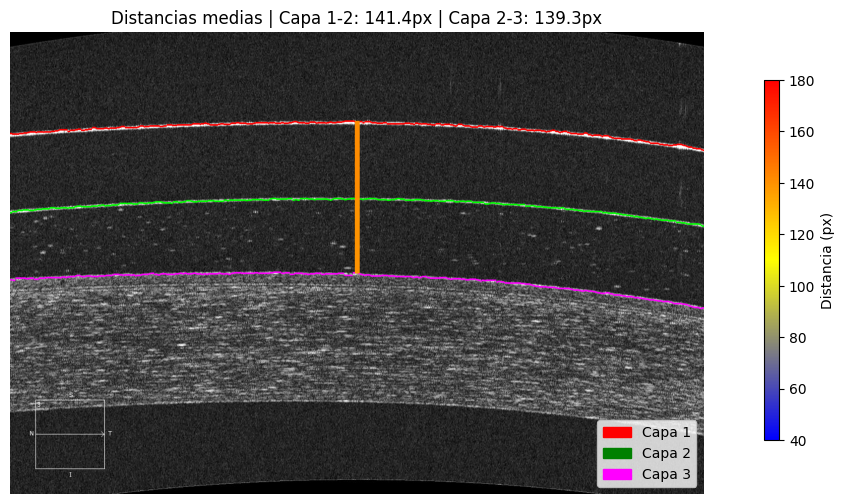

In [22]:
for image in image_files:

    images[image]['final_image'] = visualizar_lineas_centrales_con_leyenda(
    images[image]['segmentation_plot'],
    images[image]['picos']['y1'],
    images[image]['picos']['y2'],
    images[image]['picos']['y3'],
    images[image]['distancias']['distancias_12'],
    images[image]['distancias']['distancias_23'],
    plot=True
    )


## Informe Automático
Función completa que genera un informe visual por imagen, integrando todos los elementos anteriores:
- **Visualización Final de la Segmentación:** Imagen enriquecida con líneas de segmentación, líneas verticales coloreadas según la distancia promedio y leyenda interpretativa.
- **Mapa de calor:** Visualización tipo heatmap para observar las variaciones en el espesor columna a columna.
- **Histogramas de las distancias entre capas**
- **Tabla con los estadísticos más relevantes**

**Nota:** Si se le pasa a la función un valor para el argumento opcional *output_path*, se genera un informe automático para cada imagen en formato pdf en la ruta especificada.

In [23]:
def eye_report(input_path, output_path=None):
    """
    Función final que genera un informe visual para cada imagen del directorio.

    Parámetros:
    - input_path: ruta donde están las imágenes.
    - output_path: ruta donde guardar los informes en PDF (opcional).

    Devuelve:
    - No retorna nada explícitamente, pero guarda y/o muestra el informe visual.
    """

    # Cargamos las imágenes
    images, image_files = cargar_imagenes(input_path, plot=False)

    for image in image_files:
        # Preprocesado de imágenes
        images[image]['filtered'] = preprocesado_imagen(images[image]['original'], image_name=image, plot=False)
        
        # Encontrar capas
        [y1s, y2s, y3s] = segmentar_capas_por_columnas_manual(images[image]['filtered'])
        images[image]['picos'] = {'y1': y1s, 'y2': y2s, 'y3': y3s}
        
        # Segmentación capas
        images[image]['segmentation_plot'] = dibujar_segmentacion(images[image]['original'], images[image]['picos']['y1'], images[image]['picos']['y2'], images[image]['picos']['y3'], plot=False)
        
        # Calcular distancias entre capas
        distancias_12 = []
        distancias_23 = []
        distancias_13 = []
        for i in range(len(images[image]['picos']['y1'])):
            distancias_12.append(abs(images[image]['picos']['y1'][i] - images[image]['picos']['y2'][i]))
            distancias_23.append(abs(images[image]['picos']['y2'][i] - images[image]['picos']['y3'][i]))
            distancias_13.append(abs(images[image]['picos']['y1'][i] - images[image]['picos']['y3'][i]))
        images[image]["distancias"] = {"distancias_12":distancias_12, "distancias_23":distancias_23, "distancias_13":distancias_13}
        
        # Calcular métricas
        images[image]['estadisticas'] = calcular_estadisticas(images[image]["distancias"]["distancias_12"], images[image]["distancias"]["distancias_23"], images[image]["distancias"]["distancias_13"], plot=False)

        # Comprobar normalidad
        
        ### PLOTS
        fig = plt.figure(figsize=(11, 15), constrained_layout=True)
        fig.suptitle("Resumen Imagen {}".format(image), fontsize=18, fontweight='bold')
        grid = GridSpec(10, 3, figure=fig)

        # Imagen original + capas + distancias
        subf1 = fig.add_subplot(grid[:5, :])
        images[image]['final_image'] = visualizar_lineas_centrales_con_leyenda(
        images[image]['segmentation_plot'],
        images[image]['picos']['y1'],
        images[image]['picos']['y2'],
        images[image]['picos']['y3'],
        images[image]['distancias']['distancias_12'],
        images[image]['distancias']['distancias_23'],
        plot=False
        )
        # Leyenda de capas
        leyenda = [
            Patch(color='red', label='Capa 1'),
            Patch(color='green', label='Capa 2'),
            Patch(color='magenta', label='Capa 3')
        ]
        subf1.legend(handles=leyenda, loc='lower right', fontsize=10)
        subf1.imshow(images[image]['final_image'])
        subf1.axis('off')
   
        # Mapa de distancias por columna
        subf2 = fig.add_subplot(grid[5, :])
        dist_map = np.vstack([
            images[image]["distancias"]["distancias_12"],
            images[image]["distancias"]["distancias_23"]
        ])
        cmap = LinearSegmentedColormap.from_list("custom", ["blue", "yellow", "red"])
        sns.heatmap(dist_map, cmap=cmap, cbar=True, ax=subf2)
        subf2.set_yticks([0.5, 1.5])
        subf2.set_yticklabels(['Capa 1-2', 'Capa 2-3'], rotation=0)
        subf2.set_title("Mapa de calor de distancias")
        subf2.set_xlabel("Columna")

        # Histograma de distancia lente-córnea (distancia capas 1-2)
        subf4 = fig.add_subplot(grid[6:8, 0])
        subf4.hist(images[image]["distancias"]["distancias_12"], bins=30, color='red', alpha=0.7)
        subf4.set_title("Histograma de distancia lente-córnea")
        subf4.set_xlabel("Espesor (píxeles)")
        subf4.set_ylabel("Frecuencia")
        # subf4.set_xticks(ticks=10)
        subf4.grid(False)

        # Histograma de espesor corneal (distancia capas 2-3)
        subf5 = fig.add_subplot(grid[6:8, 1])
        subf5.hist(images[image]["distancias"]["distancias_23"], bins=30, color='green', alpha=0.7)
        subf5.set_title("Histograma de espesor corneal")
        subf5.set_xlabel("Espesor (píxeles)")
        subf5.set_ylabel("Frecuencia")
        subf5.grid(False)

        # Histograma de distancia total (distancia capas 1-3)
        subf6 = fig.add_subplot(grid[6:8, 2])
        subf6.hist(images[image]["distancias"]["distancias_13"], bins=30, color='purple', alpha=0.7)
        subf6.set_title("Histograma de distancia total")
        subf6.set_xlabel("Espesor (píxeles)")
        subf6.set_ylabel("Frecuencia")
        subf6.grid(False)

        # Tabla de estadísticos
        subf7 = fig.add_subplot(grid[8:, :])
        subf7.axis('off')
        tabla = obtener_tabla_metrica(
            images[image]["distancias"]["distancias_12"],
            images[image]["distancias"]["distancias_23"],
            images[image]["distancias"]["distancias_13"]
        )
        # Dividimos entre datos numéricos y columnas categóricas
        cols_numericas = tabla.select_dtypes(include=[np.number])
        cols_texto = tabla.select_dtypes(exclude=[np.number])
        # Redondear solo las numéricas
        cell_text = np.round(cols_numericas.values, 2).astype(str)
        # Concatenar con texto (por ejemplo los "Sí"/"No")
        if not cols_texto.empty:
            cell_text = np.concatenate([cell_text, cols_texto.values], axis=1)
        # Etiquetas finales
        col_labels = list(cols_numericas.columns) + list(cols_texto.columns)
        # Pintar tabla
        tabla_plot = subf7.table(
            cellText=cell_text,
            colLabels=col_labels,
            rowLabels=tabla.index,
            loc='center',
            cellLoc='center'
        )
        tabla_plot.scale(1, 2.2)
        tabla_plot.auto_set_font_size(False)
        tabla_plot.set_fontsize(8)

        if output_path is not None:
            os.makedirs(output_path, exist_ok=True) # Crear directorio si no existe
            filename = os.path.splitext(image)[0] + "_informe.pdf"
            export_path = os.path.join(output_path, filename)
            fig.savefig(export_path, format='pdf', bbox_inches='tight')
        
        plt.show()

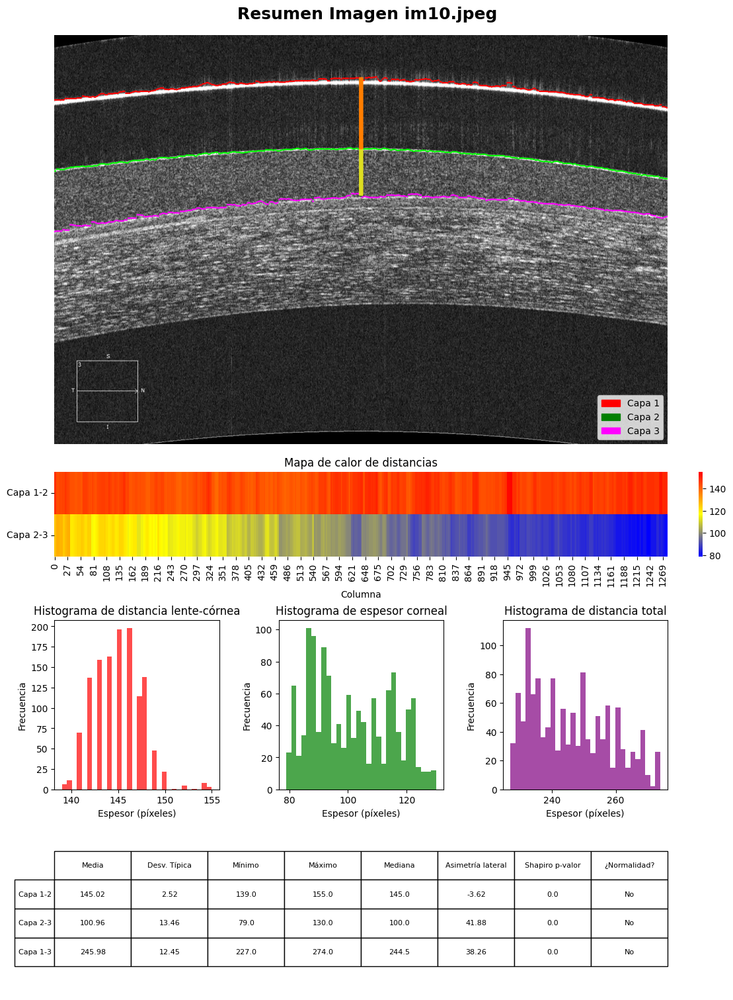

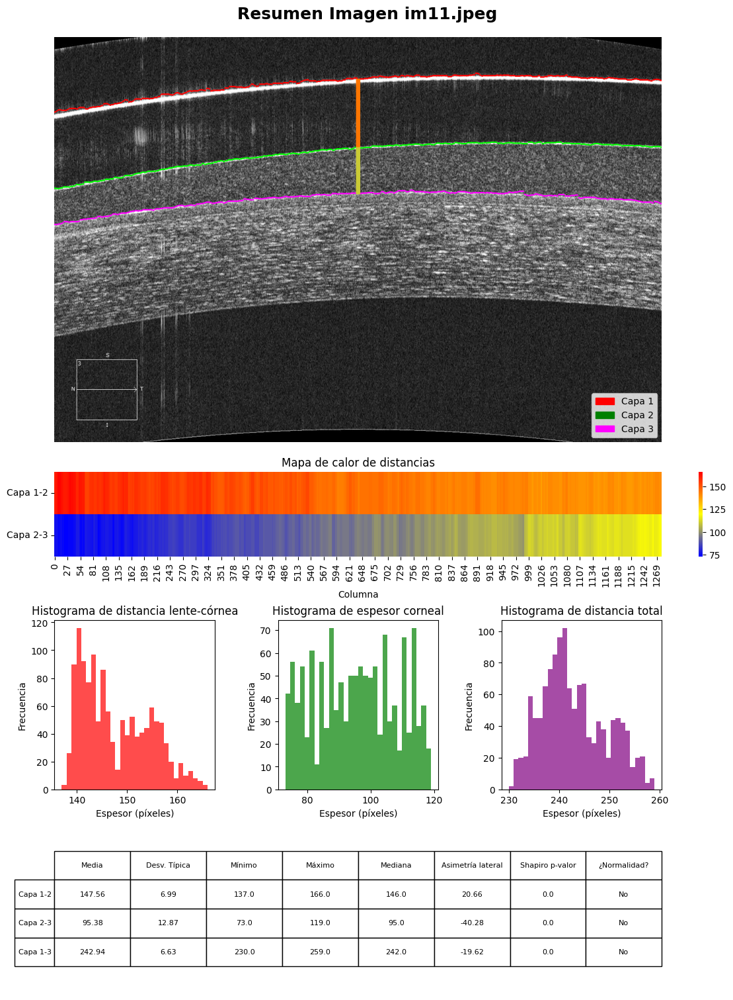

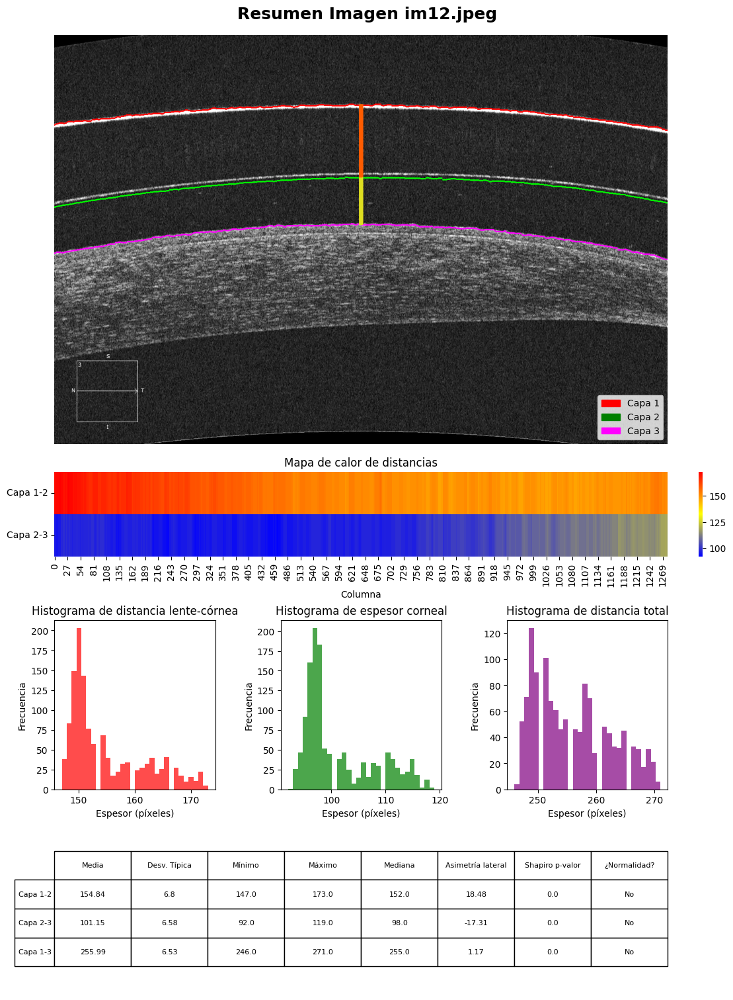

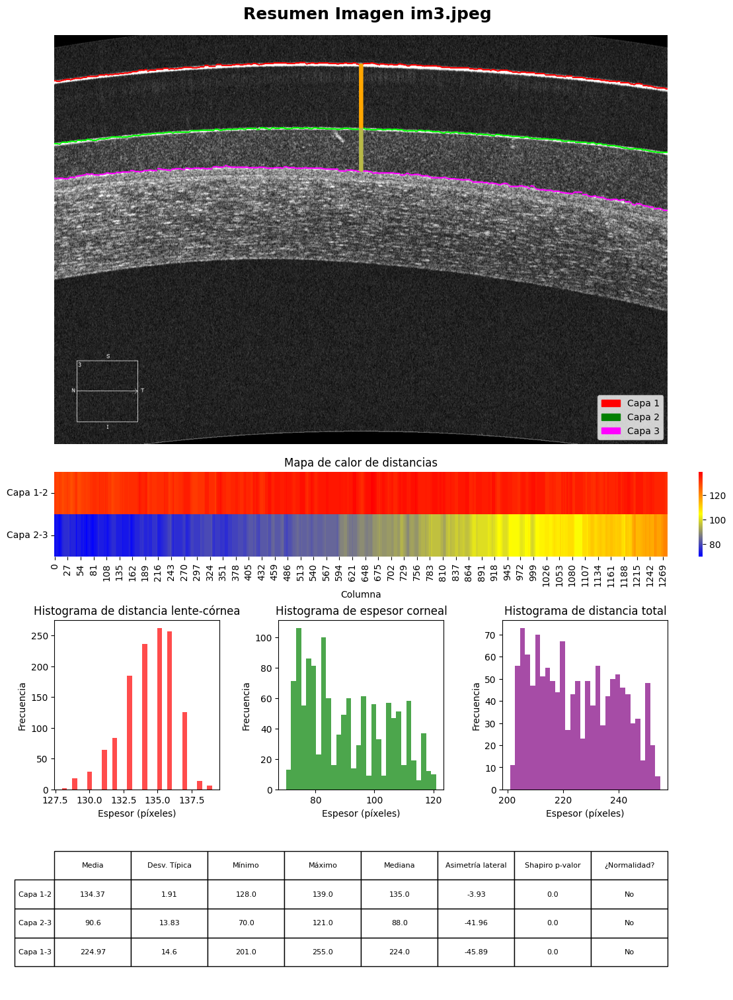

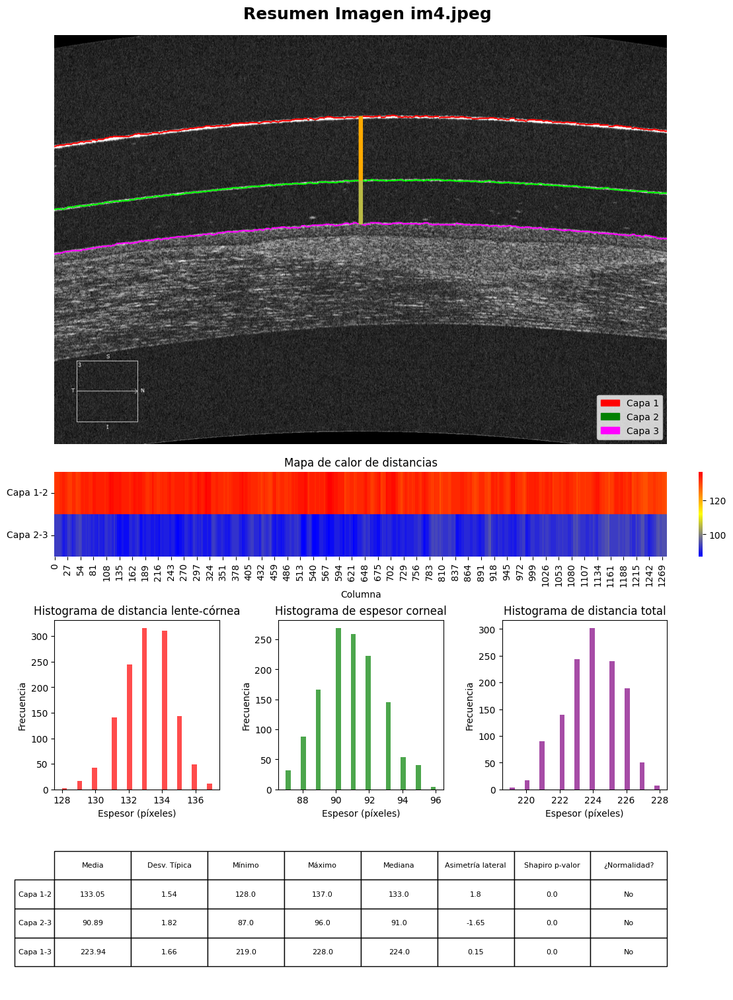

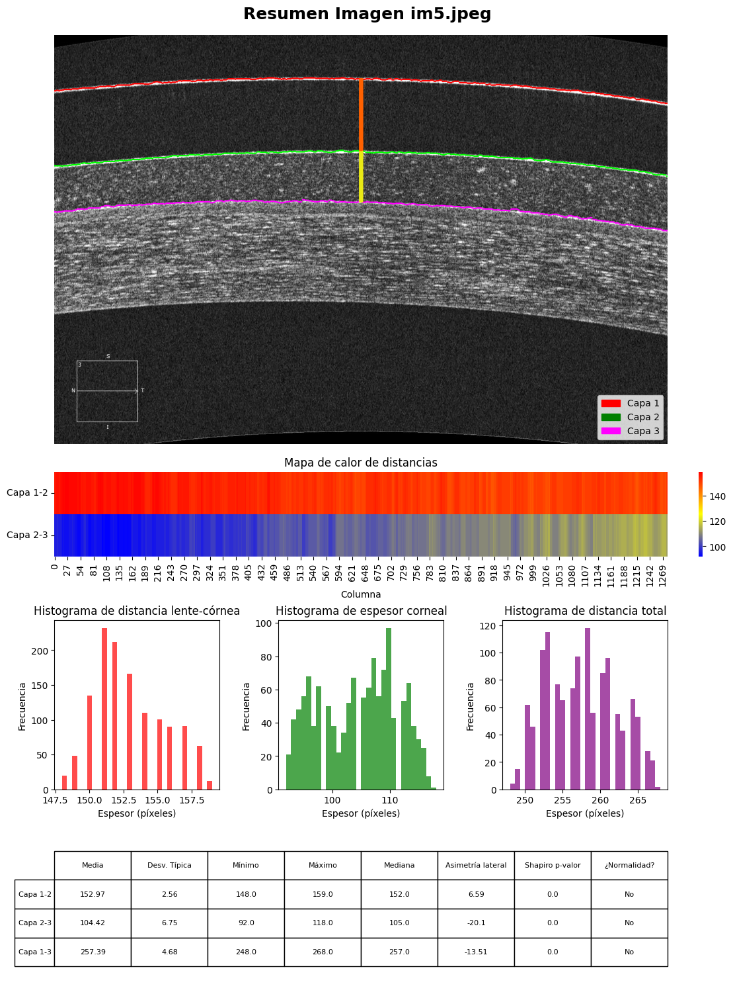

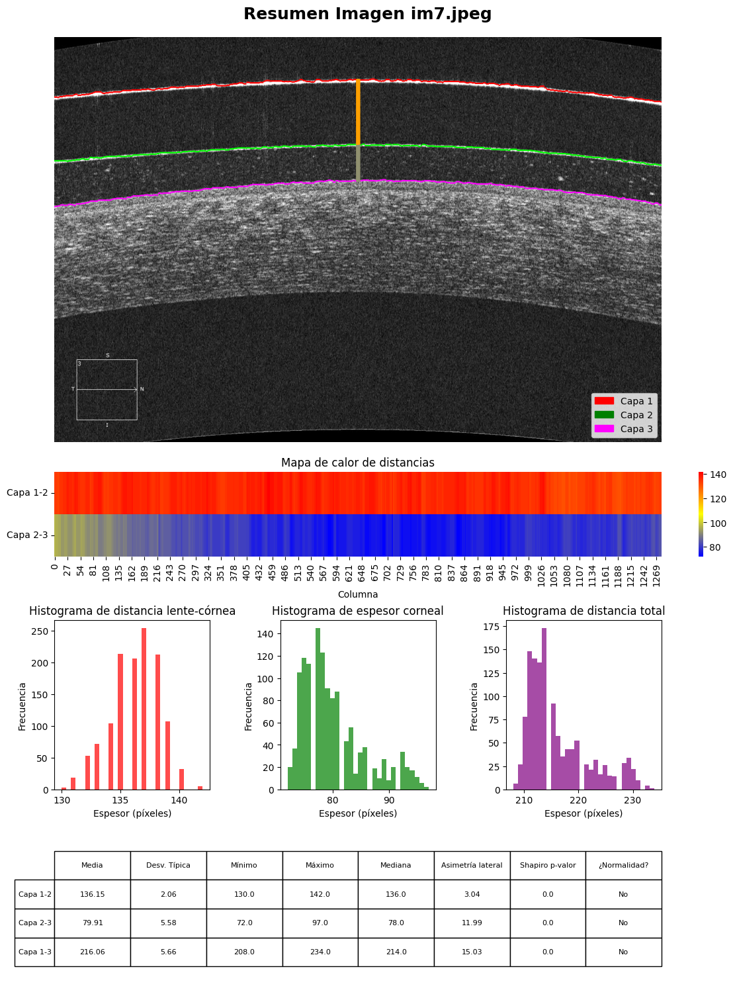

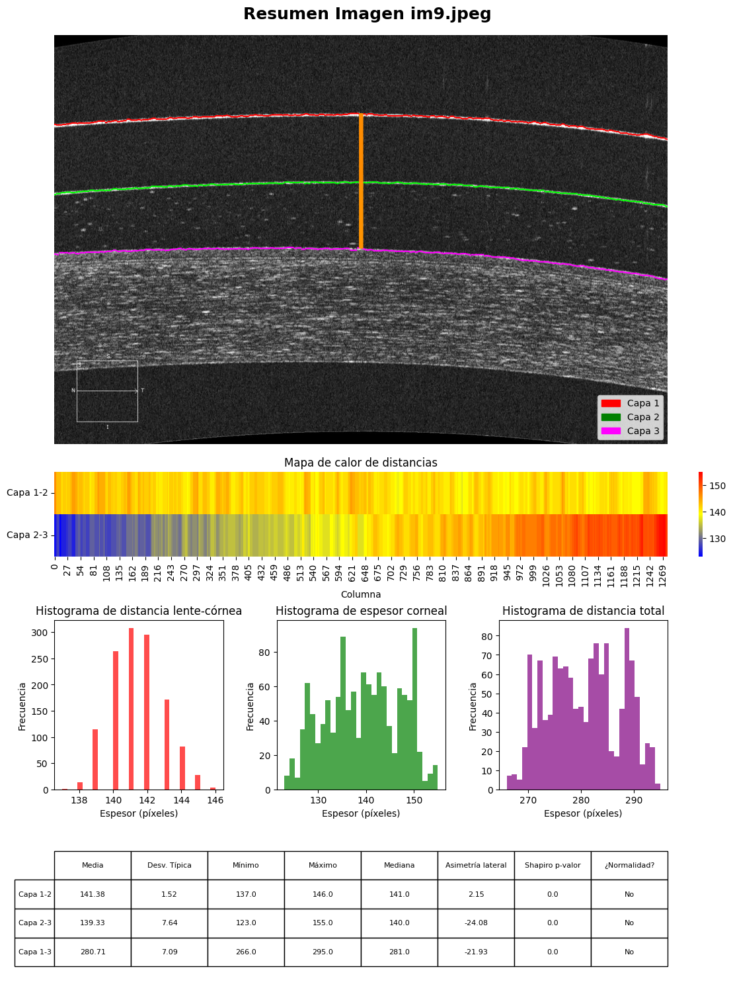

In [24]:
eye_report("D:/MUBICS/Imagen_Biomedica/Practicas/P2/Dataset AS-OCT/Dataset AS-OCT/AS-OCT", output_path="D:/MUBICS/Imagen_Biomedica/Practicas/P2/reports/")